In [ ]:
import warnings
warnings.filterwarnings('ignore')

#importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from word2number import w2n
from tqdm import tqdm

In [ ]:
df=pd.read_excel("airbnb-listings.xlsx")

In [ ]:
copied_df = df.copy()

In [ ]:
pd.set_option('display.max_rows',70000,'display.max_columns',5000)

In [ ]:
df.head()

,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,Neighborhood Overview,Notes,Transit,Access,Interaction,House Rules,Thumbnail Url,Medium Url,Picture Url,XL Picture Url,Host ID,Host URL,Host Name,Host Since,Host Location,Host About,Host Response Time,Host Response Rate,Host Acceptance Rate,Host Thumbnail Url,Host Picture Url,Host Neighbourhood,Host Listings Count,Host Total Listings Count,Host Verifications,Street,Neighbourhood,Neighbourhood Cleansed,Neighbourhood Group Cleansed,City,State,Zipcode,Market,Smart Location,Country Code,Country,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Square Feet,Price,Weekly Price,Monthly Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Calendar Updated,Has Availability,Availability 30,Availability 60,Availability 90,Availability 365,Calendar last Scraped,Number of Reviews,First Review,Last Review,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,6017649,https://www.airbnb.com/rooms/6017649,20170402075052,2017-04-02,Nice room at Vondelpark,Nice and clean private bedroom near the city c...,"I offer a cuzy, private room in a nice apartme...",Nice and clean private bedroom near the city c...,none,Really nice and quiet nighborhood!,NaN,Directly train connection to Central Station a...,Acces to shared use of the bathroom facilities...,NaN,NaN,https://a0.muscache.com/im/pictures/74942550/4...,https://a0.muscache.com/im/pictures/74942550/4...,https://public.opendatasoft.com/api/datasets/1...,https://a0.muscache.com/im/pictures/74942550/4...,1195000,https://www.airbnb.com/users/show/1195000,Linda,2011-09-22,"Amsterdam, North Holland, Netherlands",NaN,NaN,NaN,NaN,https://a0.muscache.com/im/users/1195000/profi...,https://a0.muscache.com/im/users/1195000/profi...,NaN,1.0,1.0,"email, phone, facebook, reviews","Amsterdam, Noord-Holland 1054, Netherlands",NaN,De Baarsjes - Oud-West,NaN,Amsterdam,Noord-Holland,1054,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.359927,4.862860,Apartment,Private room,1.0,1.0,1.0,1.0,Real Bed,"Internet, Wireless Internet, Kitchen, Heating,...",NaN,50.0,NaN,NaN,NaN,NaN,1.0,0.0,1.0,1125.0,22 months ago,NaN,0.0,0.0,0.0,0.0,2017-04-02,3.0,2015-05-10,2015-06-08,90.0,10.0,9.0,10.0,9.0,9.0,9.0,NaN,Amsterdam,flexible,1.0,0.13,"52.35992696894107, 4.862859671199358",Host Has Profile Pic
1,9192415,https://www.airbnb.com/rooms/9192415,20170402075052,2017-04-02,Cozy apartment center Amsterdam,Cozy 2 person apartment in Amsterdam on walkin...,"The appartment has a living room, a kitchen, a...",Cozy 2 person apartment in Amsterdam on walkin...,none,This is an apartment situated at the West side...,NaN,"Vondelpark, Museum Square, Leidsplein is on wa...",NaN,NaN,"-smoking in the house is strictly forbidden, b...",https://a0.muscache.com/im/pictures/eb9e20e1-9...,https://a0.muscache.com/im/pictures/eb9e20e1-9...,https://public.opendatasoft.com/api/datasets/1...,https://a0.muscache.com/im/pictures/eb9e20e1-9...,47820987,https://www.airbnb.com/users/show/47820987,Annabel,2015-10-31,"Amsterdam, North Holland, Netherlands","I'm from belgian, but currently living in Amst...",within a few hours,100.0,NaN,https://a0.muscache.com/im/pictures/0fc41f38-7...,https://a0.muscache.com/im/pictures/0fc41f38-7...,Oud-West,1.0,1.0,"email, phone, reviews, jumio, government_id","Oud-West, Amsterdam, Noord-Holland 1054 HP, Ne...",Oud-West,De Baarsjes - Oud-West,NaN,Amsterdam,Noord-Holland,1054 HP,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.361371,4.873860,Apartment,Entire home/apt,2.0,1.0,1.0,1.0,Real Bed,"TV, Cable TV, Internet, Wireless Internet, Kit...",NaN,95.0,NaN,NaN,NaN,15.0,2.0,40.0,2.0,7.0,2 months ago,NaN,0.0,0.0,0.0,0.0,2017

In [ ]:
df.tail()

,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,Neighborhood Overview,Notes,Transit,Access,Interaction,House Rules,Thumbnail Url,Medium Url,Picture Url,XL Picture Url,Host ID,Host URL,Host Name,Host Since,Host Location,Host About,Host Response Time,Host Response Rate,Host Acceptance Rate,Host Thumbnail Url,Host Picture Url,Host Neighbourhood,Host Listings Count,Host Total Listings Count,Host Verifications,Street,Neighbourhood,Neighbourhood Cleansed,Neighbourhood Group Cleansed,City,State,Zipcode,Market,Smart Location,Country Code,Country,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Square Feet,Price,Weekly Price,Monthly Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Calendar Updated,Has Availability,Availability 30,Availability 60,Availability 90,Availability 365,Calendar last Scraped,Number of Reviews,First Review,Last Review,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
494949,4749982,https://www.airbnb.com/rooms/4749982,20170507222235,2017-05-08,Appartamento zona Wedding,Questo elegante appartamento si trova nel quar...,Questo elegante appartamento si trova nel quar...,Questo elegante appartamento si trova nel quar...,none,NaN,NaN,NaN,NaN,NaN,Si prega di non fumare nell' appartamento. I f...,NaN,NaN,https://public.opendatasoft.com/api/datasets/1...,NaN,15686693,https://www.airbnb.com/users/show/15686693,Sergio,2014-05-18,IT,NaN,within a few hours,80.0,NaN,https://a0.muscache.com/im/users/15686693/prof...,https://a0.muscache.com/im/users/15686693/prof...,Zona 2,3.0,3.0,"email, phone, reviews, jumio","Berlino, Berlin 13349, Germany",NaN,Parkviertel,Mitte,Berlino,Berlin,13349,Berlin,"Berlino, Germany",DE,Germany,52.563218,13.341143,Apartment,Entire home/apt,3.0,1.0,1.0,2.0,Real Bed,"TV, Internet, Wireless Internet, Kitchen, Elev...",NaN,49.0,320.0,800.0,100.0,60.0,1.0,15.0,60.0,1125.0,6 weeks ago,NaN,0.0,0.0,5.0,280.0,2017-05-08,2.0,2015-11-29,2016-12-02,90.0,9.0,8.0,8.0,9.0,9.0,8.0,NaN,NaN,moderate,1.0,0.11,"52.56321787546623, 13.341142634091602","Host Has Profile Pic, Host Identity Verified"
494950,16822451,https://www.airbnb.com/rooms/16822451,20170507222235,2017-05-08,Lovely apartment very close to airport Tegel,Wir bieten euch ein privates Zimmer im Wedding...,Our apartment is a typical old Berlin building...,Wir bieten euch ein privates Zimmer im Wedding...,none,Eure Unterkunft liegt im aufblühenden Bezirk W...,NaN,Bus 221/128: one minute walk. 20 minutes to Te...,The apartment has a balcony (you can see the T...,We hope that you'll have a great stay at our p...,NaN,NaN,NaN,https://public.opendatasoft.com/api/datasets/1...,NaN,105416704,https://www.airbnb.com/users/show/105416704,Constanze,2016-11-28,"Berlin, Berlin, Germany",NaN,within an hour,100.0,NaN,https://a0.muscache.com/im/pictures/a3c9ac1b-4...,https://a0.muscache.com/im/pictures/a3c9ac1b-4...,Wedding,1.0,1.0,"email, phone, google, reviews, jumio, governme...","Wedding, Berlin, Berlin 13351, Germany",Wedding,Parkviertel,Mitte,Berlin,Berlin,13351,Berlin,"Berlin, Germany",DE,Germany,52.550743,13.341502,Apartment,Private room,2.0,1.0,1.0,1.0,Real Bed,"Wireless Internet, Kitchen, Heating, Essential...",NaN,36.0,NaN,NaN,NaN,5.0,1.0,0.0,2.0,1125.0,5 days ago,NaN,20.0,50.0,67.0,67.0,2017-05-08,3.0,2017-03-09,2017-04-30,100.0,10.0,10.0,10.0,10.0,10.0,10.0,NaN,NaN,flexible,1.0,1.48,"52.55074301180134, 13.341502220777464","Host Has Profile Pic, Host Identity Verified, ..."
494951,17998459,https://www.airbnb.com/rooms/17998459,20170507222235,2017-05-08,Amazing Room in the heart of Europe (Berlin) ❤,Big and bright room located in one of the be...,NaN,Big and bright room located in one of the be...,none,

In [ ]:
df.shape

(494954, 89)

In [ ]:
df.describe()

,Host ID,Host Response Rate,Host Listings Count,Host Total Listings Count,Latitude,Longitude,Accommodates,Bathrooms,Bedrooms,Beds,Square Feet,Price,Weekly Price,Monthly Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Availability 30,Availability 60,Availability 90,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Calculated host listings count,Reviews per Month
count,4.949540e+05,379884.000000,494449.000000,494448.000000,494953.000000,494953.000000,494891.000000,493428.000000,494328.000000,494037.000000,12209.000000,486996.000000,97747.000000,96091.000000,204012.000000,315715.000000,494952.000000,494917.000000,494952.000000,4.949520e+05,494952.000000,494952.000000,494952.000000,494952.000000,494952.000000,367134.000000,366237.000000,366479.000000,365918.000000,366434.000000,365969.000000,365873.000000,494087.000000,372947.000000
mean,3.234417e+07,93.376549,9.549721,9.549738,38.042292,-15.020974,3.311584,1.249632,1.378322,1.934525,575.544762,138.072703,493.650127,2961.696277,274.126703,62.267906,1.550235,12.028728,3.470415,2.123406e+05,9.961726,22.997256,37.878594,166.092332,16.740850,92.913988,9.527773,9.328483,9.692770,9.709972,9.471171,9.323047,6.869659,1.479523
std,3.172156e+07,17.592441,57.199523,57.199579,22.941429,70.364294,2.094052,0.607029,0.942508,1.488128,1825.903405,149.670499,215.538103,4688.495984,171.605763,75.746943,1.224923,31.189786,89.396359,2.024385e+07,10.981093,22.351102,33.856420,140.510625,32.336701,8.543725,0.852536,1.035356,0.727947,0.719978,0.803260,0.903585,41.977381,1.731931
min,1.900000e+01,0.000000,0.000000,0.000000,-38.224427,-123.218712,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,0.010000
25%,6.886060e+06,98.000000,1.000000,1.000000,38.913119,-73.969216,2.000000,1.000000,1.000000,1.000000,0.000000,55.000000,320.000000,1178.500000,150.000000,20.000000,1.000000,0.000000,1.000000,3.200000e+01,0.000000,0.000000,0.000000,14.000000,1.000000,90.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,1.000000,0.320000
50%,2.188181e+07,100.000000,1.000000,1.000000,42.310894,2.137584,2.000000,1.000000,1.000000,1.000000,377.000000,90.000000,475.000000,1840.000000,200.000000,40.000000,1.000000,0.000000,2.000000,1.125000e+03,5.000000,17.000000,33.000000,148.000000,4.000000,95.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,0.880000
75%,4.792177e+07,100.000000,3.000000,3.000000,51.375424,12.444849,4.000000,1.000000,2.000000,2.000000,800.000000,150.000000,650.000000,3000.000000,350.000000,75.000000,2.000000,15.000000,3.000000,1.125000e+03,19.000000,44.000000,71.000000,313.000000,18.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,2.000000,2.030000
max,1.350885e+08,100.000000,1114.000000,1114.000000,55.994889,153.637837,21.000000,10.000000,96.000000,19.000000,129167.000000,999.000000,999.000000,280016.000000,999.000000,999.000000,20.000000,999.000000,60000.000000,2.147484e+09,30.000000,60.000000,90.000000,365.000000,735.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,752.000000,223.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 494954 entries, 0 to 494953
Data columns (total 89 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              494954 non-null  object 
 1   Listing Url                     494954 non-null  object 
 2   Scrape ID                       494954 non-null  object 
 3   Last Scraped                    494953 non-null  object 
 4   Name                            494536 non-null  object 
 5   Summary                         478753 non-null  object 
 6   Space                           347018 non-null  object 
 7   Description                     494794 non-null  object 
 8   Experiences Offered             494954 non-null  object 
 9   Neighborhood Overview           291604 non-null  object 
 10  Notes                           197590 non-null  object 
 11  Transit                         303786 non-null  object 
 12  Access          

In [ ]:
list(df.columns)

['ID',
 'Listing Url',
 'Scrape ID',
 'Last Scraped',
 'Name',
 'Summary',
 'Space',
 'Description',
 'Experiences Offered',
 'Neighborhood Overview',
 'Notes',
 'Transit',
 'Access',
 'Interaction',
 'House Rules',
 'Thumbnail Url',
 'Medium Url',
 'Picture Url',
 'XL Picture Url',
 'Host ID',
 'Host URL',
 'Host Name',
 'Host Since',
 'Host Location',
 'Host About',
 'Host Response Time',
 'Host Response Rate',
 'Host Acceptance Rate',
 'Host Thumbnail Url',
 'Host Picture Url',
 'Host Neighbourhood',
 'Host Listings Count',
 'Host Total Listings Count',
 'Host Verifications',
 'Street',
 'Neighbourhood',
 'Neighbourhood Cleansed',
 'Neighbourhood Group Cleansed',
 'City',
 'State',
 'Zipcode',
 'Market',
 'Smart Location',
 'Country Code',
 'Country',
 'Latitude',
 'Longitude',
 'Property Type',
 'Room Type',
 'Accommodates',
 'Bathrooms',
 'Bedrooms',
 'Beds',
 'Bed Type',
 'Amenities',
 'Square Feet',
 'Price',
 'Weekly Price',
 'Monthly Price',
 'Security Deposit',
 'Cleaning Fee

In [ ]:
for x in df.columns:
    print (x)

ID
Listing Url
Scrape ID
Last Scraped
Name
Summary
Space
Description
Experiences Offered
Neighborhood Overview
Notes
Transit
Access
Interaction
House Rules
Thumbnail Url
Medium Url
Picture Url
XL Picture Url
Host ID
Host URL
Host Name
Host Since
Host Location
Host About
Host Response Time
Host Response Rate
Host Acceptance Rate
Host Thumbnail Url
Host Picture Url
Host Neighbourhood
Host Listings Count
Host Total Listings Count
Host Verifications
Street
Neighbourhood
Neighbourhood Cleansed
Neighbourhood Group Cleansed
City
State
Zipcode
Market
Smart Location
Country Code
Country
Latitude
Longitude
Property Type
Room Type
Accommodates
Bathrooms
Bedrooms
Beds
Bed Type
Amenities
Square Feet
Price
Weekly Price
Monthly Price
Security Deposit
Cleaning Fee
Guests Included
Extra People
Minimum Nights
Maximum Nights
Calendar Updated
Has Availability
Availability 30
Availability 60
Availability 90
Availability 365
Calendar last Scraped
Number of Reviews
First Review
Last Review
Review Scores Rati

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Host ID,494954.0,3.234417e+07,3.172156e+07,19.000000,6.886060e+06,2.188181e+07,4.792177e+07,1.350885e+08
Host Response Rate,379884.0,9.337655e+01,1.759244e+01,0.000000,9.800000e+01,1.000000e+02,1.000000e+02,1.000000e+02
Host Listings Count,494449.0,9.549721e+00,5.719952e+01,0.000000,1.000000e+00,1.000000e+00,3.000000e+00,1.114000e+03
Host Total Listings Count,494448.0,9.549738e+00,5.719958e+01,0.000000,1.000000e+00,1.000000e+00,3.000000e+00,1.114000e+03
Latitude,494953.0,3.804229e+01,2.294143e+01,-38.224427,3.891312e+01,4.231089e+01,5.137542e+01,5.599489e+01
Longitude,494953.0,-1.502097e+01,7.036429e+01,-123.218712,-7.396922e+01,2.137584e+00,1.244485e+01,1.536378e+02
Accommodates,494891.0,3.311584e+00,2.094052e+00,1.000000,2.000000e+00,2.000000e+00,4.000000e+00,2.100000e+01
Bathrooms,493428.0,1.249632e+00,6.070292e-01,0.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+01
Bedrooms,494328.0,1.378322e+00,9.425079e-01,0.000000,1.000000e+00,1.000000e+00,2.000000e+00,9.600000e+01
Beds,494037.0,1.934525e+00,1.488128e+00,0.000000,1.000000e+00,1.000000e+00,2.000000e+00,1.900000e+01


In [ ]:
df.describe(include='object').T

,count,unique,top,freq
ID,494954,494952,12512133,2
Listing Url,494954,494952,https://www.airbnb.com/rooms/12512133,2
Scrape ID,494954,43,20170404145355,56535
Last Scraped,494953,47,2017-05-03,46064
Name,494536,478223,Home away from home,55
Summary,478753,458598,"My place is good for couples, solo adventurers...",182
Space,347018,332282,This gorgeous apartment is excellently designe...,121
Description,494794,484373,"My place is good for couples, solo adventurers...",128
Experiences Offered,494954,6,none,491735
Neighborhood Overview,291604,261076,(URL HIDDEN),168


<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Null Values Percentage</span>

In [ ]:
null_columns = df.columns[df.isnull().any()] #shows columns with null values
df[null_columns].isnull().sum()*100/len(df) # percentage of null values

Last Scraped                       0.000202
Name                               0.084452
Summary                            3.273233
Space                             29.888838
Description                        0.032326
Neighborhood Overview             41.084626
Notes                             60.079118
Transit                           38.623387
Access                            45.772941
Interaction                       48.185286
House Rules                       39.991393
Thumbnail Url                     19.160164
Medium Url                        19.160366
Picture Url                        0.148297
XL Picture Url                    19.160164
Host Name                          0.102030
Host Since                         0.102030
Host Location                      0.457214
Host About                        40.141104
Host Response Time                23.248423
Host Response Rate                23.248625
Host Acceptance Rate              91.462237
Host Thumbnail Url              

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Removing null values in price column</span>

In [ ]:
df['Price'].isnull().sum()

7958

In [ ]:
#Dropping the rows of null values for price column
df.dropna(subset=['Price'], inplace=True)

In [ ]:
df['Price'].isnull().sum()

0

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Experienced Offer</span>

In [ ]:
df['Name']

0                                   Nice room at Vondelpark
1                           Cozy apartment center Amsterdam
2                         Le Quartier Sonang-Kamar Bidadari
3         Trendy and spacious rooftop apt (115m2) in centre
4                        nice apartment in centre amsterdam
                                ...                        
494949                            Appartamento zona Wedding
494950         Lovely apartment very close to airport Tegel
494951       Amazing Room in the heart of Europe (Berlin) ❤
494952      Well-connected, clean, private room in Wedding.
494953                          colour your life in Berlin.
Name: Name, Length: 486996, dtype: object

In [ ]:
df['Summary']

0         Nice and clean private bedroom near the city c...
1         Cozy 2 person apartment in Amsterdam on walkin...
2         ‘Le Quartier Sonang’ is a peaceful, quiet town...
3         A beautiful 2 bedroom apt (115 m2) with a an a...
4                                                       NaN
                                ...                        
494949    Questo elegante appartamento si trova nel quar...
494950    Wir bieten euch ein privates Zimmer im Wedding...
494951    Big and bright room   located in one of the be...
494952    The flat is well connected to local amenities ...
494953    Hello, do you want to spend a couple of days i...
Name: Summary, Length: 486996, dtype: object

In [ ]:
df['Space']

0         I offer a cuzy, private room in a nice apartme...
1         The appartment has a living room, a kitchen, a...
2         We opened our doors on the 25th of April 2012 ...
3         This spacious top floor apartment is completel...
4         This beautiful apartment has a spacious living...
                                ...                        
494949    Questo elegante appartamento si trova nel quar...
494950    Our apartment is a typical old Berlin building...
494951                                                  NaN
494952                                                  NaN
494953                                                  NaN
Name: Space, Length: 486996, dtype: object

In [ ]:
df['Description']

0         Nice and clean private bedroom near the city c...
1         Cozy 2 person apartment in Amsterdam on walkin...
2         ‘Le Quartier Sonang’ is a peaceful, quiet town...
3         A beautiful 2 bedroom apt (115 m2) with a an a...
4         This beautiful apartment has a spacious living...
                                ...                        
494949    Questo elegante appartamento si trova nel quar...
494950    Wir bieten euch ein privates Zimmer im Wedding...
494951    Big and bright room   located in one of the be...
494952    The flat is well connected to local amenities ...
494953    Hello, do you want to spend a couple of days i...
Name: Description, Length: 486996, dtype: object

In [ ]:
df['Experiences Offered']

0         none
1         none
2         none
3         none
4         none
          ... 
494949    none
494950    none
494951    none
494952    none
494953    none
Name: Experiences Offered, Length: 486996, dtype: object

In [ ]:
df['Experiences Offered'].value_counts()

Experiences Offered
none        483780
business      1045
social         924
family         823
romantic       423
1                1
Name: count, dtype: int64

In [ ]:
#Replacing the column of "1" with "none" and then working on none columns
#Doing so , we will put it in correct category
df['Experiences Offered'] = df['Experiences Offered'].replace("1","none")
df['Experiences Offered'].value_counts()

Experiences Offered
none        483781
business      1045
social         924
family         823
romantic       423
Name: count, dtype: int64

In [ ]:
#collecting the none rows in column "Experiences Offered"
rows_with_none_experiences = df[df['Experiences Offered'] == 'none']


#Changing the None values by comparing the words in columns "Name", "Summary","Space", "Description"
for index, row in rows_with_none_experiences.iterrows():
    for keyword in ['business','social','family','romantic']:
        if isinstance(row['Name'], str) and keyword in row['Name'] or isinstance(row['Summary'], str) and keyword in row['Summary'] or isinstance(row['Space'], str) and keyword in row['Space'] or isinstance(row['Description'], str) and keyword in row['Description']:
            df.at[index,'Experiences Offered']=keyword
            break
        else:
            df.at[index,'Experiences Offered']='business'

#Also changing the null values to business(Mode)
df.loc[df['Experiences Offered'].isnull(),'Experiences Offered']='business'

In [ ]:
df['Experiences Offered'].value_counts()

Experiences Offered
business    444092
family       33510
romantic      5144
social        4250
Name: count, dtype: int64

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Host Since</span>

In [ ]:
from datetime import datetime
from dateutil import relativedelta

In [ ]:
df['Host Since']

0         2011-09-22
1         2015-10-31
2         2012-10-17
3         2014-07-04
4         2011-11-27
             ...    
494949    2014-05-18
494950    2016-11-28
494951    2016-09-03
494952    2015-04-14
494953    2014-07-03
Name: Host Since, Length: 486996, dtype: object

In [ ]:
df['Host Since'].value_counts()

Host Since
2015-05-21    1063
2012-09-20     899
2015-03-30     607
2015-07-29     582
2015-06-09     567
2015-07-06     550
2016-06-29     534
2015-07-16     513
2016-01-12     513
2014-05-19     513
2015-06-08     510
2015-06-22     506
2015-08-17     500
2015-07-21     494
2015-04-27     492
2015-05-11     491
2015-07-14     489
2015-09-04     481
2015-07-02     477
2015-06-30     476
2015-06-15     471
2013-07-10     470
2015-04-13     469
2016-04-04     467
2015-07-13     466
2015-08-04     461
2015-07-08     457
2014-07-21     450
2015-06-01     449
2015-07-20     446
2015-12-01     445
2015-06-24     445
2015-06-14     444
2015-06-03     443
2015-09-14     443
2015-06-02     442
2015-08-11     442
2015-06-29     442
2015-05-20     439
2016-07-04     439
2014-08-04     438
2015-11-11     438
2015-11-09     437
2015-07-23     435
2015-05-04     435
2015-07-01     434
2015-07-27     433
2014-03-10     430
2015-05-18     430
2015-06-23     430
2015-07-07     429
2015-05-25     429
2

In [ ]:
df['Host Since'].isnull().sum()

491

In [ ]:
#Filling all the Nan values with a default date 2023-01-01
df['Host Since'].fillna(value = '2023-01-01',inplace=True)

In [ ]:
df['Host Since'].unique()

array(['2011-09-22', '2015-10-31', '2012-10-17', ..., '2008-05-26',
       '2008-08-26', '2009-06-22'], dtype=object)

In [ ]:
# the code calculates and records the number of months since each host
#joined Airbnb based on the 'Host Since' date and the current date.
#This information is stored in a new column called 'Months'.
today = datetime.now()
months_difference = []
df['Host Since']= pd.to_datetime(df['Host Since'])

for index, row in df.iterrows():
    difference = int(((today - row['Host Since']).days/30))
    months_difference.append(difference)

df['Months']= months_difference

In [ ]:
df['Months']

0         148
1          98
2         135
3         115
4         146
         ... 
494949    116
494950     85
494951     88
494952    105
494953    115
Name: Months, Length: 486996, dtype: int64

In [ ]:
df['Months'].isnull().sum()

0

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Host Response Time</span>

<span style="font-family: Helvetica; color:blue; font-size: 15px;">Handling this column by changing the text in each row by different keywords like "1 Hour" "Few Hours" "1 Day" "Few Days" </span>

In [ ]:
df['Host Response Time']

0                        NaN
1         within a few hours
2               within a day
3         within a few hours
4             within an hour
                 ...        
494949    within a few hours
494950        within an hour
494951    within a few hours
494952          within a day
494953        within an hour
Name: Host Response Time, Length: 486996, dtype: object

In [ ]:
df['Host Response Time'].value_counts()

Host Response Time
within an hour         196523
within a few hours      95445
within a day            70145
a few days or more      12206
-122.41000020536359         1
Name: count, dtype: int64

In [ ]:
df['Host Response Time'].unique()

array([nan, 'within a few hours', 'within a day', 'within an hour',
       'a few days or more', '-122.41000020536359'], dtype=object)

In [ ]:
df['Host Response Time'] = df['Host Response Time'].replace("within an hour","1 Hour")
df['Host Response Time'] = df['Host Response Time'].replace("within a few hours","Few Hours")
df['Host Response Time'] = df['Host Response Time'].replace("within a day","1 Day")
df['Host Response Time'] = df['Host Response Time'].replace("-122.41000020536359","1 Day")
df['Host Response Time'] = df['Host Response Time'].replace("a few days or more","Few Days")

In [ ]:
df['Host Response Time'].value_counts()

Host Response Time
1 Hour       196523
Few Hours     95445
1 Day         70146
Few Days      12206
Name: count, dtype: int64

In [ ]:
df['Host Response Time'].isnull().sum()

112676

In [ ]:
df['Host Response Time'].fillna(value='1 Hour',inplace=True)

In [ ]:
df['Host Response Time'].value_counts()

Host Response Time
1 Hour       196523
1 Hour       112676
Few Hours     95445
1 Day         70146
Few Days      12206
Name: count, dtype: int64

In [ ]:
df['Host Response Time'].unique()

array(['1 Hour', 'Few\xa0Hours', '1\xa0Day', '1\xa0Hour', 'Few\xa0Days'],
      dtype=object)

In [ ]:
# Replace non-breaking spaces with regular spaces
df['Host Response Time'] = df['Host Response Time'].str.replace('\xa0', ' ')

# Now, when you check unique values, you should get a cleaner result
unique_response_times = df['Host Response Time'].unique()
print(unique_response_times)

['1 Hour' 'Few Hours' '1 Day' 'Few Days']


In [ ]:
df['Host Response Time'].value_counts()

Host Response Time
1 Hour       309199
Few Hours     95445
1 Day         70146
Few Days      12206
Name: count, dtype: int64

In [ ]:
df['Host Response Time'].isnull().sum()

0

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Host Response Rate</span>

<span style="font-family: Helvetica; color:Blue; font-size: 15px;">Handling this column by filling the null values by 100.0(Mode) </span>

In [ ]:
df['Host Response Rate']

0           NaN
1         100.0
2         100.0
3         100.0
4         100.0
          ...  
494949     80.0
494950    100.0
494951     88.0
494952     82.0
494953    100.0
Name: Host Response Rate, Length: 486996, dtype: float64

In [ ]:
df['Host Response Rate'].value_counts()

Host Response Rate
100.0    272205
90.0      13952
80.0       7482
99.0       7025
0.0        6599
50.0       5233
98.0       4895
97.0       3914
67.0       3513
96.0       3430
94.0       3165
75.0       3101
70.0       2957
95.0       2877
92.0       2638
93.0       2591
88.0       2554
60.0       2553
89.0       2377
83.0       2275
86.0       2244
91.0       1642
33.0       1227
40.0       1071
71.0        913
85.0        854
78.0        791
87.0        761
82.0        679
79.0        609
25.0        535
73.0        513
84.0        463
20.0        456
81.0        419
57.0        416
63.0        400
77.0        383
30.0        358
56.0        288
74.0        287
72.0        259
68.0        244
69.0        227
64.0        224
43.0        218
76.0        194
10.0        179
44.0        146
17.0        145
29.0        133
38.0        124
65.0        120
62.0        106
58.0         96
55.0         88
42.0         87
14.0         71
53.0         66
61.0         63
36.0         62
13.0 

In [ ]:
df['Host Response Rate'].isnull().sum()

112677

In [ ]:
#Filling all the null value with 100
df['Host Response Rate'].fillna(100.0,inplace=True)

In [ ]:
df['Host Response Rate'].value_counts()

Host Response Rate
100.0    384882
90.0      13952
80.0       7482
99.0       7025
0.0        6599
50.0       5233
98.0       4895
97.0       3914
67.0       3513
96.0       3430
94.0       3165
75.0       3101
70.0       2957
95.0       2877
92.0       2638
93.0       2591
88.0       2554
60.0       2553
89.0       2377
83.0       2275
86.0       2244
91.0       1642
33.0       1227
40.0       1071
71.0        913
85.0        854
78.0        791
87.0        761
82.0        679
79.0        609
25.0        535
73.0        513
84.0        463
20.0        456
81.0        419
57.0        416
63.0        400
77.0        383
30.0        358
56.0        288
74.0        287
72.0        259
68.0        244
69.0        227
64.0        224
43.0        218
76.0        194
10.0        179
44.0        146
17.0        145
29.0        133
38.0        124
65.0        120
62.0        106
58.0         96
55.0         88
42.0         87
14.0         71
53.0         66
61.0         63
36.0         62
13.0 

In [ ]:
df['Host Response Rate'].isnull().sum()

0

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Host Acceptance Rate</span>

In [ ]:
df['Host Acceptance Rate'].value_counts()

Host Acceptance Rate
100%         22618
0%            1044
50%            989
67%            811
96%            783
99%            703
94%            684
75%            669
91%            666
92%            644
98%            635
83%            631
86%            629
97%            601
88%            590
93%            586
80%            560
95%            485
90%            476
89%            472
85%            319
87%            304
71%            293
33%            291
82%            266
78%            256
60%            249
84%            225
77%            189
55%            172
79%            170
81%            168
68%            165
63%            154
57%            146
72%            139
56%            133
69%            130
45%            129
73%            121
64%            114
70%            111
36%            110
76%            107
74%            105
25%            105
40%             78
62%             73
65%             69
61%             66
47%             61
58%       

In [ ]:
df['Host Acceptance Rate'].unique()

array([nan, '96%', '100%', '89%', '83%', '75%', '56%', '25%', '78%',
       '92%', '86%', '88%', '93%', '91%', '68%', '55%', '97%', '94%',
       '0%', '98%', '99%', '80%', '90%', '67%', '29%', '45%', '43%',
       '48%', '76%', '87%', '62%', '57%', '36%', '44%', '66%', '61%',
       '79%', '95%', '81%', '73%', '63%', '64%', '85%', '46%', '60%',
       '84%', '72%', '50%', '33%', '70%', '71%', '65%', '77%', '40%',
       '74%', '20%', '82%', '39%', '47%', '69%', '58%', '14%', '42%',
       '54%', '30%', '27%', '38%', '31%', '18%', '13%', '51%', '24%',
       '17%', '23%', 'Apartment', '41%', '59%', '52%', '37%', '28%', '9%',
       '22%', '53%', '35%', '49%', '15%', '26%', '19%', '21%', '10%',
       '12%', '32%', '11%', '5%', '8%'], dtype=object)

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">We are stripping the "%" symbol from the values.</span>

In [ ]:
df['Host Acceptance Rate'] = df['Host Acceptance Rate'].str.replace('%','')

In [ ]:
df['Host Acceptance Rate'].unique()

array([nan, '96', '100', '89', '83', '75', '56', '25', '78', '92', '86',
       '88', '93', '91', '68', '55', '97', '94', '0', '98', '99', '80',
       '90', '67', '29', '45', '43', '48', '76', '87', '62', '57', '36',
       '44', '66', '61', '79', '95', '81', '73', '63', '64', '85', '46',
       '60', '84', '72', '50', '33', '70', '71', '65', '77', '40', '74',
       '20', '82', '39', '47', '69', '58', '14', '42', '54', '30', '27',
       '38', '31', '18', '13', '51', '24', '17', '23', 'Apartment', '41',
       '59', '52', '37', '28', '9', '22', '53', '35', '49', '15', '26',
       '19', '21', '10', '12', '32', '11', '5', '8'], dtype=object)

In [ ]:
df['Host Acceptance Rate'].value_counts()

Host Acceptance Rate
100          22618
0             1044
50             989
67             811
96             783
99             703
94             684
75             669
91             666
92             644
98             635
83             631
86             629
97             601
88             590
93             586
80             560
95             485
90             476
89             472
85             319
87             304
71             293
33             291
82             266
78             256
60             249
84             225
77             189
55             172
79             170
81             168
68             165
63             154
57             146
72             139
56             133
69             130
45             129
73             121
64             114
70             111
36             110
76             107
74             105
25             105
40              78
62              73
65              69
61              66
47              61
58        

<span style="font-family: Helvetica; color: blue; font-weight: bold; font-size: 20px;">Working on Replacing 'Apartment' with the value 100.</span>

In [ ]:
#There is only one value "Apartment" available which needs to be changed
#Replacing "Apartment " to 100(mode)
df['Host Acceptance Rate'] = df['Host Acceptance Rate'].replace("Apartment","100")

In [ ]:
df['Host Acceptance Rate'].value_counts()

Host Acceptance Rate
100    22619
0       1044
50       989
67       811
96       783
99       703
94       684
75       669
91       666
92       644
98       635
83       631
86       629
97       601
88       590
93       586
80       560
95       485
90       476
89       472
85       319
87       304
71       293
33       291
82       266
78       256
60       249
84       225
77       189
55       172
79       170
81       168
68       165
63       154
57       146
72       139
56       133
69       130
45       129
73       121
64       114
70       111
36       110
76       107
74       105
25       105
40        78
62        73
65        69
61        66
47        61
58        60
38        56
54        55
44        53
20        48
66        46
43        45
46        44
17        40
52        35
42        34
53        31
29        30
30        28
39        28
31        25
59        24
23        21
48        20
27        16
14        16
51        13
35        10
26         9
15  

In [ ]:
df['Host Acceptance Rate'].isnull().sum()

445838

<span style="font-family: Helvetica; color:Blue; font-size: 15px;">Handling this column by removing the percentage sign and changing the column into float type. Also, filling the null values by mean of the column values. </span>

In [ ]:
#Calculating the mean value of the column to fill it in the Nan values
# Convert 'Host Acceptance Rate' column to a numeric data type (float)
df['Host Acceptance Rate'] = pd.to_numeric(df['Host Acceptance Rate'], errors='coerce')

# Calculate the mean
mean_acceptance_rate = df['Host Acceptance Rate'].mean()

print("Mean Host Acceptance Rate:", mean_acceptance_rate)

Mean Host Acceptance Rate: 88.09679770639973


In [ ]:
df['Host Acceptance Rate'].value_counts()

Host Acceptance Rate
100.0    22619
0.0       1044
50.0       989
67.0       811
96.0       783
99.0       703
94.0       684
75.0       669
91.0       666
92.0       644
98.0       635
83.0       631
86.0       629
97.0       601
88.0       590
93.0       586
80.0       560
95.0       485
90.0       476
89.0       472
85.0       319
87.0       304
71.0       293
33.0       291
82.0       266
78.0       256
60.0       249
84.0       225
77.0       189
55.0       172
79.0       170
81.0       168
68.0       165
63.0       154
57.0       146
72.0       139
56.0       133
69.0       130
45.0       129
73.0       121
64.0       114
70.0       111
36.0       110
76.0       107
74.0       105
25.0       105
40.0        78
62.0        73
65.0        69
61.0        66
47.0        61
58.0        60
38.0        56
54.0        55
44.0        53
20.0        48
66.0        46
43.0        45
46.0        44
17.0        40
52.0        35
42.0        34
53.0        31
29.0        30
30.0        28
39.0

In [ ]:
df['Host Acceptance Rate'].unique()

array([ nan,  96., 100.,  89.,  83.,  75.,  56.,  25.,  78.,  92.,  86.,
        88.,  93.,  91.,  68.,  55.,  97.,  94.,   0.,  98.,  99.,  80.,
        90.,  67.,  29.,  45.,  43.,  48.,  76.,  87.,  62.,  57.,  36.,
        44.,  66.,  61.,  79.,  95.,  81.,  73.,  63.,  64.,  85.,  46.,
        60.,  84.,  72.,  50.,  33.,  70.,  71.,  65.,  77.,  40.,  74.,
        20.,  82.,  39.,  47.,  69.,  58.,  14.,  42.,  54.,  30.,  27.,
        38.,  31.,  18.,  13.,  51.,  24.,  17.,  23.,  41.,  59.,  52.,
        37.,  28.,   9.,  22.,  53.,  35.,  49.,  15.,  26.,  19.,  21.,
        10.,  12.,  32.,  11.,   5.,   8.])

In [ ]:
#Replacing Nan values to mean
df['Host Acceptance Rate'].fillna(value ='88.0',inplace=True)

In [ ]:
df['Host Acceptance Rate'].value_counts()

Host Acceptance Rate
88.0     445838
100.0     22619
0.0        1044
50.0        989
67.0        811
96.0        783
99.0        703
94.0        684
75.0        669
91.0        666
92.0        644
98.0        635
83.0        631
86.0        629
97.0        601
88.0        590
93.0        586
80.0        560
95.0        485
90.0        476
89.0        472
85.0        319
87.0        304
71.0        293
33.0        291
82.0        266
78.0        256
60.0        249
84.0        225
77.0        189
55.0        172
79.0        170
81.0        168
68.0        165
63.0        154
57.0        146
72.0        139
56.0        133
69.0        130
45.0        129
73.0        121
64.0        114
70.0        111
36.0        110
76.0        107
25.0        105
74.0        105
40.0         78
62.0         73
65.0         69
61.0         66
47.0         61
58.0         60
38.0         56
54.0         55
44.0         53
20.0         48
66.0         46
43.0         45
46.0         44
17.0         40
52.

In [ ]:
df['Host Acceptance Rate'].unique()

array(['88.0', 96.0, 100.0, 89.0, 83.0, 75.0, 56.0, 25.0, 78.0, 92.0,
       86.0, 88.0, 93.0, 91.0, 68.0, 55.0, 97.0, 94.0, 0.0, 98.0, 99.0,
       80.0, 90.0, 67.0, 29.0, 45.0, 43.0, 48.0, 76.0, 87.0, 62.0, 57.0,
       36.0, 44.0, 66.0, 61.0, 79.0, 95.0, 81.0, 73.0, 63.0, 64.0, 85.0,
       46.0, 60.0, 84.0, 72.0, 50.0, 33.0, 70.0, 71.0, 65.0, 77.0, 40.0,
       74.0, 20.0, 82.0, 39.0, 47.0, 69.0, 58.0, 14.0, 42.0, 54.0, 30.0,
       27.0, 38.0, 31.0, 18.0, 13.0, 51.0, 24.0, 17.0, 23.0, 41.0, 59.0,
       52.0, 37.0, 28.0, 9.0, 22.0, 53.0, 35.0, 49.0, 15.0, 26.0, 19.0,
       21.0, 10.0, 12.0, 32.0, 11.0, 5.0, 8.0], dtype=object)

In [ ]:
df['Host Acceptance Rate'] = df['Host Acceptance Rate'].replace("88","88.09")

In [ ]:
df['Host Acceptance Rate'].value_counts()

Host Acceptance Rate
88.0     445838
100.0     22619
0.0        1044
50.0        989
67.0        811
96.0        783
99.0        703
94.0        684
75.0        669
91.0        666
92.0        644
98.0        635
83.0        631
86.0        629
97.0        601
88.0        590
93.0        586
80.0        560
95.0        485
90.0        476
89.0        472
85.0        319
87.0        304
71.0        293
33.0        291
82.0        266
78.0        256
60.0        249
84.0        225
77.0        189
55.0        172
79.0        170
81.0        168
68.0        165
63.0        154
57.0        146
72.0        139
56.0        133
69.0        130
45.0        129
73.0        121
64.0        114
70.0        111
36.0        110
76.0        107
25.0        105
74.0        105
40.0         78
62.0         73
65.0         69
61.0         66
47.0         61
58.0         60
38.0         56
54.0         55
44.0         53
20.0         48
66.0         46
43.0         45
46.0         44
17.0         40
52.

In [ ]:
df['Host Acceptance Rate'].isnull().sum()

0

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Finding Correlation between 'Host Listings Count and 'Host Total Listings Count'</span>

In [ ]:
correlation = df['Host Listings Count'].corr(df['Host Total Listings Count'])

In [ ]:
correlation

1.0

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Since correlation between these two columns is '1.0', so we are going to drop 'Host Listings Count'</span>

In [ ]:
df['Host Total Listings Count'].value_counts()

Host Total Listings Count
1.0       284902
2.0        72215
3.0        31048
4.0        17068
5.0        10744
6.0         7707
7.0         5575
8.0         4804
9.0         3673
10.0        3057
11.0        2714
12.0        2149
15.0        1742
14.0        1702
13.0        1673
16.0        1485
18.0        1201
20.0        1111
19.0        1025
25.0         999
21.0         970
23.0         922
17.0         916
26.0         836
24.0         770
22.0         764
959.0        752
735.0        704
34.0         681
27.0         669
30.0         585
29.0         571
28.0         556
33.0         536
32.0         518
0.0          505
35.0         493
31.0         458
36.0         441
38.0         410
43.0         406
47.0         390
37.0         376
39.0         375
49.0         363
62.0         363
56.0         346
41.0         334
53.0         307
67.0         296
57.0         283
55.0         281
51.0         277
76.0         276
46.0         275
60.0         274
52.0         270
44.0 

In [ ]:
df['Host Total Listings Count'].isnull().sum()

491

In [ ]:
#assigning '1' to the null values because a host must have one airbnb
df['Host Total Listings Count'].fillna(value ='1',inplace=True)

In [ ]:
df['Host Total Listings Count'].isnull().sum()

0

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Working on Property Type</span>

In [ ]:
df['Property Type']

0               Apartment
1               Apartment
2         Bed & Breakfast
3               Apartment
4               Apartment
               ...       
494949          Apartment
494950          Apartment
494951          Apartment
494952          Apartment
494953          Apartment
Name: Property Type, Length: 486996, dtype: object

In [ ]:
df['Property Type'].value_counts()

Property Type
Apartment                 346360
House                      91669
Bed & Breakfast            12057
Condominium                10144
Loft                        5865
Townhouse                   5802
Other                       3149
Villa                       3013
Guesthouse                  1633
Bungalow                    1213
Dorm                        1195
Boat                         908
Cabin                        785
Chalet                       638
Boutique hotel               510
Serviced apartment           415
Hostel                       395
Camper/RV                    379
Timeshare                    177
Guest suite                  141
Tent                          98
Vacation home                 69
Treehouse                     63
Castle                        61
In-law                        44
Earth House                   35
Hut                           29
Yurt                          27
Entire Floor                  18
Tipi                         

In [ ]:
df['Property Type'].isnull().sum()

10

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Replacing 2017-04-02 with Apartment</span>

In [ ]:
df['Property Type'] = df['Property Type'].replace("2017-04-02","Apartment")

In [ ]:
df['Property Type'].value_counts()

Property Type
Apartment                 346361
House                      91669
Bed & Breakfast            12057
Condominium                10144
Loft                        5865
Townhouse                   5802
Other                       3149
Villa                       3013
Guesthouse                  1633
Bungalow                    1213
Dorm                        1195
Boat                         908
Cabin                        785
Chalet                       638
Boutique hotel               510
Serviced apartment           415
Hostel                       395
Camper/RV                    379
Timeshare                    177
Guest suite                  141
Tent                          98
Vacation home                 69
Treehouse                     63
Castle                        61
In-law                        44
Earth House                   35
Hut                           29
Yurt                          27
Entire Floor                  18
Tipi                         

In [ ]:
df['Room Type'][df['Property Type'].isnull()]

13642     Entire home/apt
71014     Entire home/apt
84062        Private room
177254    Entire home/apt
308114       Private room
355287    Entire home/apt
379123       Private room
387577       Private room
395448    Entire home/apt
406988       Private room
Name: Room Type, dtype: object

In [ ]:
df['Property Type'][84062]='Guesthouse'
df['Property Type'][308114]='Guesthouse'
df['Property Type'][379123]='Guesthouse'
df['Property Type'][387577]='Guesthouse'
df['Property Type'][406988]='Guesthouse'

In [ ]:
#Filling few rows with "Apartment"
df['Property Type'][13642]='Apartment'
df['Property Type'][71014]='Apartment'
df['Property Type'][177254]='Apartment'
df['Property Type'][355287]='Apartment'
df['Property Type'][395448]='Apartment'

df['Property Type'].value_counts()

Property Type
Apartment                 346366
House                      91669
Bed & Breakfast            12057
Condominium                10144
Loft                        5865
Townhouse                   5802
Other                       3149
Villa                       3013
Guesthouse                  1638
Bungalow                    1213
Dorm                        1195
Boat                         908
Cabin                        785
Chalet                       638
Boutique hotel               510
Serviced apartment           415
Hostel                       395
Camper/RV                    379
Timeshare                    177
Guest suite                  141
Tent                          98
Vacation home                 69
Treehouse                     63
Castle                        61
In-law                        44
Earth House                   35
Hut                           29
Yurt                          27
Entire Floor                  18
Tipi                         

In [ ]:
df['Property Type'].value_counts()

Property Type
Apartment                 346366
House                      91669
Bed & Breakfast            12057
Condominium                10144
Loft                        5865
Townhouse                   5802
Other                       3149
Villa                       3013
Guesthouse                  1638
Bungalow                    1213
Dorm                        1195
Boat                         908
Cabin                        785
Chalet                       638
Boutique hotel               510
Serviced apartment           415
Hostel                       395
Camper/RV                    379
Timeshare                    177
Guest suite                  141
Tent                          98
Vacation home                 69
Treehouse                     63
Castle                        61
In-law                        44
Earth House                   35
Hut                           29
Yurt                          27
Entire Floor                  18
Tipi                         

In [ ]:
df['Property Type'].isnull().sum()

0

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Working on Room Type</span>

In [ ]:
df['Room Type']

0            Private room
1         Entire home/apt
2            Private room
3         Entire home/apt
4         Entire home/apt
               ...       
494949    Entire home/apt
494950       Private room
494951       Private room
494952       Private room
494953       Private room
Name: Room Type, Length: 486996, dtype: object

In [ ]:
df['Room Type'].value_counts()

Room Type
Entire home/apt    306115
Private room       171965
Shared room          8915
9                       1
Name: count, dtype: int64

In [ ]:
df['Room Type'].isnull().sum()

0

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Replacing "9" with "Entire home/apt"</span>

In [ ]:
df['Room Type']= df['Room Type'].replace("9","Entire home/apt")

In [ ]:
df['Room Type'].value_counts()

Room Type
Entire home/apt    306116
Private room       171965
Shared room          8915
Name: count, dtype: int64

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Working on Beds, Bathrooms, Bedrooms and Bed Type</span>

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Beds</span>

In [ ]:
df['Beds']

0         1.0
1         1.0
2         1.0
3         3.0
4         1.0
         ... 
494949    2.0
494950    1.0
494951    1.0
494952    1.0
494953    1.0
Name: Beds, Length: 486996, dtype: float64

In [ ]:
df['Beds'].value_counts()

Beds
1.0     263396
2.0     120568
3.0      48247
4.0      27291
5.0      11798
6.0       7344
7.0       2587
8.0       2173
10.0       865
9.0        698
16.0       345
12.0       302
11.0       197
14.0       121
13.0        78
15.0        56
0.0         27
17.0         1
19.0         1
Name: count, dtype: int64

In [ ]:
df['Beds'].isnull().sum()

901

In [ ]:
df['Beds'].fillna(1,inplace=True)

In [ ]:
df['Beds'].value_counts()

Beds
1.0     264297
2.0     120568
3.0      48247
4.0      27291
5.0      11798
6.0       7344
7.0       2587
8.0       2173
10.0       865
9.0        698
16.0       345
12.0       302
11.0       197
14.0       121
13.0        78
15.0        56
0.0         27
17.0         1
19.0         1
Name: count, dtype: int64

In [ ]:
df['Beds'].isnull().sum()

0

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Bathrooms</span>

In [ ]:
df['Bathrooms'].value_counts()

Bathrooms
1.0    374938
2.0     57270
1.5     26898
2.5      8310
3.0      8124
0.5      2902
4.0      1939
3.5      1877
0.0      1370
5.0       622
4.5       432
6.0       277
8.0       229
5.5       121
7.0        99
6.5        63
7.5        22
Name: count, dtype: int64

In [ ]:
df['Bathrooms'].isnull().sum()

1503

In [ ]:
df['Bathrooms'].fillna(1,inplace=True)

In [ ]:
df['Bathrooms'].value_counts()

Bathrooms
1.0    376441
2.0     57270
1.5     26898
2.5      8310
3.0      8124
0.5      2902
4.0      1939
3.5      1877
0.0      1370
5.0       622
4.5       432
6.0       277
8.0       229
5.5       121
7.0        99
6.5        63
7.5        22
Name: count, dtype: int64

In [ ]:
df['Bathrooms'].isnull().sum()

0

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Bedrooms</span>

In [ ]:
df['Bedrooms'].value_counts()

Bedrooms
1.0     311662
2.0      88067
0.0      36887
3.0      33775
4.0      11680
5.0       2954
6.0        864
7.0        223
8.0        108
10.0       106
9.0         47
96.0         1
Name: count, dtype: int64

In [ ]:
df['Bedrooms'].isnull().sum()

622

In [ ]:
df['Bedrooms'].fillna(df['Beds'],inplace=True)

In [ ]:
df['Bedrooms'].isnull().sum()

0

In [ ]:
df['Bedrooms'].value_counts()

Bedrooms
1.0     312133
2.0      88171
0.0      36887
3.0      33803
4.0      11691
5.0       2956
6.0        868
7.0        224
8.0        109
10.0       106
9.0         47
96.0         1
Name: count, dtype: int64

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">Bed Type</span>

In [ ]:
df['Bed Type']

0         Real Bed
1         Real Bed
2         Real Bed
3         Real Bed
4         Real Bed
            ...   
494949    Real Bed
494950    Real Bed
494951    Real Bed
494952    Real Bed
494953    Real Bed
Name: Bed Type, Length: 486996, dtype: object

In [ ]:
df['Bed Type'].value_counts()

Bed Type
Real Bed         470405
Pull-out Sofa      9718
Futon              3574
Couch              1995
Airbed             1303
9                     1
Name: count, dtype: int64

In [ ]:
df['Bed Type'] = df['Bed Type'].replace("9","Real Bed")

In [ ]:
df['Bed Type'].value_counts()

Bed Type
Real Bed         470406
Pull-out Sofa      9718
Futon              3574
Couch              1995
Airbed             1303
Name: count, dtype: int64

In [ ]:
df['Bed Type'].isnull().sum()

0

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Working on Accommodates</span>

In [ ]:
df['Accommodates']

0         1.0
1         2.0
2         2.0
3         4.0
4         2.0
         ... 
494949    3.0
494950    2.0
494951    2.0
494952    1.0
494953    1.0
Name: Accommodates, Length: 486996, dtype: float64

In [ ]:
df['Accommodates'].value_counts()

Accommodates
2.0     210145
4.0      98349
3.0      46858
1.0      42723
6.0      36223
5.0      23846
8.0      11780
7.0       6659
10.0      4078
9.0       1967
12.0      1639
16.0      1144
11.0       547
14.0       522
13.0       241
15.0       211
18.0         1
17.0         1
Name: count, dtype: int64

In [ ]:
df['Accommodates'].isnull().sum()

62

<span style="font-family: Helvetica; color: #9D0191; font-weight: bold; font-size: 15px;">The action of multiplying the number of bedrooms by 2 to fill in null values for Airbnb accommodation is based on the assumption that, on average, there are approximately two people per bedroom.</span>

In [ ]:
df['Accommodates'].fillna(df['Bedrooms']*2,inplace=True)

In [ ]:
df['Accommodates'].isnull().sum()

0

In [ ]:
df['Accommodates'].value_counts()

Accommodates
2.0      210174
4.0       98369
3.0       46858
1.0       42723
6.0       36231
5.0       23846
8.0       11781
7.0        6659
10.0       4078
9.0        1967
12.0       1639
16.0       1144
11.0        547
14.0        522
13.0        241
15.0        211
0.0           3
192.0         1
18.0          1
17.0          1
Name: count, dtype: int64

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Working on Amenities</span>

In [ ]:
df['Amenities']

0         Internet, Wireless Internet, Kitchen, Heating,...
1         TV, Cable TV, Internet, Wireless Internet, Kit...
2         TV, Internet, Wireless Internet, Breakfast, He...
3         TV, Cable TV, Internet, Wireless Internet, Kit...
4         Wireless Internet, Kitchen, Hot tub, Buzzer/wi...
                                ...                        
494949    TV, Internet, Wireless Internet, Kitchen, Elev...
494950    Wireless Internet, Kitchen, Heating, Essential...
494951    Wireless Internet, Kitchen, Elevator in buildi...
494952    translation missing: en.hosting_amenity_49, tr...
494953    Wireless Internet, Kitchen, Heating, Family/ki...
Name: Amenities, Length: 486996, dtype: object

In [ ]:
  df['Amenities'].value_counts()

Amenities
translation missing: en.hosting_amenity_49, translation missing: en.hosting_amenity_50                                                                                                                                                                  740
Family/kid friendly                                                                                                                                                                                                                                     523
Internet, Wireless Internet, Kitchen, Heating, Washer, Essentials                                                                                                                                                                                       243
Family/kid friendly, translation missing: en.hosting_amenity_50                                                                                                                                                                           

In [ ]:
def has_tv(amenities):
    if isinstance(amenities, str) and ('TV' in amenities or 'Cable TV' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'TV' column
df['TV'] = df['Amenities'].apply(has_tv)

In [ ]:
df['TV'].value_counts()

TV
yes    351599
no     135397
Name: count, dtype: int64

In [ ]:
# Define a function to combine Internet and Wireless Internet in a column name Internet
def has_internet(amenities):
  """Returns 'Yes' if the amenities string contains the word 'Internet' or 'Wireless Internet', otherwise returns 'No'."""
  if isinstance(amenities, str) and ('Internet' in amenities or 'Wireless Internet' in amenities):
    return 'Yes'
  else:
    return 'No'

# Apply the function to create the 'Internet' column
df['Internet'] = df['Amenities'].apply(has_internet)

# Print the updated DataFra

In [ ]:
df['Internet'].value_counts()

Internet
Yes    461072
No      25924
Name: count, dtype: int64

In [ ]:
def has_kitchen(amenities):
    if isinstance(amenities, str) and 'Kitchen' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Kitchen' column
df['Kitchen'] = df['Amenities'].apply(has_kitchen)

In [ ]:
df['Kitchen'].value_counts()

Kitchen
yes    445187
no      41809
Name: count, dtype: int64

In [ ]:
def has_heating(amenities):
    if isinstance(amenities, str) and 'Heating' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Heating' column
df['Heating'] = df['Amenities'].apply(has_heating)

In [ ]:
df['Heating'].value_counts()

Heating
yes    432787
no      54209
Name: count, dtype: int64

In [ ]:
def has_washer(amenities):
    if isinstance(amenities, str) and 'Washer' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Washer' column
df['Washer'] = df['Amenities'].apply(has_washer)

In [ ]:
df['Washer'].value_counts()

Washer
yes    356906
no     130090
Name: count, dtype: int64

In [ ]:
def has_firstaid(amenities):
    if isinstance(amenities, str) and 'First aid kit' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'First Aid Kit' column
df['First aid kit'] = df['Amenities'].apply(has_firstaid)

In [ ]:
df['First aid kit'].value_counts()

First aid kit
no     358013
yes    128983
Name: count, dtype: int64

In [ ]:
def has_fireextinguisher(amenities):
    if isinstance(amenities, str) and 'Fire extinguisher' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Fire Extinguisher' column
df['Fire Extinguisher'] = df['Amenities'].apply(has_fireextinguisher)

In [ ]:
df['Fire Extinguisher'].value_counts()

Fire Extinguisher
no     360280
yes    126716
Name: count, dtype: int64

In [ ]:
def has_laptopfriendly(amenities):
    if isinstance(amenities, str) and 'Laptop friendly workspace' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Laptop friendly workspace' column
df['Laptop friendly workspace'] = df['Amenities'].apply(has_laptopfriendly)

In [ ]:
df['Laptop friendly workspace'].value_counts()

Laptop friendly workspace
no     264248
yes    222748
Name: count, dtype: int64

In [ ]:
def has_petsliveonproperty(amenities):
    if isinstance(amenities, str) and 'Pets live on this property' in amenities:
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Pest live on property' column
df['Pets live on property'] = df['Amenities'].apply(has_petsliveonproperty)

In [ ]:
df['Pets live on property'].value_counts()

Pets live on property
no     441822
yes     45174
Name: count, dtype: int64

In [ ]:
def has_petsallowed(amenities):
    if isinstance(amenities, str) and ('Pets allowed' in amenities or 'Cat(s)' in amenities or 'Dog' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Pets Allowed' column
df['Pets allowed'] = df['Amenities'].apply(has_petsallowed)

In [ ]:
df['Pets allowed'].value_counts()

Pets allowed
no     400757
yes     86239
Name: count, dtype: int64

In [ ]:
def has_bathroomamenities(amenities):
    if isinstance(amenities, str) and ('Shampoo' in amenities or 'Dryer' in amenities or 'Hair dryer' in amenities or 'Iron' in amenities or 'Hanger' in amenities or 'Essentials' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Bathroom' column
df['Bathroom Amenities'] = df['Amenities'].apply(has_bathroomamenities)

In [ ]:
df['Bathroom Amenities'].value_counts()

Bathroom Amenities
yes    459196
no      27800
Name: count, dtype: int64

In [ ]:
def has_24hourcheckin(amenities):
    if isinstance(amenities, str) and ('24-hour check-in' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the '24 hour check-in' column
df['24 Hour Check-in'] = df['Amenities'].apply(has_24hourcheckin)

In [ ]:
df['24 Hour Check-in'].value_counts()

24 Hour Check-in
no     380723
yes    106273
Name: count, dtype: int64

In [ ]:
def has_smokedetector(amenities):
    if isinstance(amenities, str) and ('Smoke detector' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Smoke detector' column
df['Smoke detector'] = df['Amenities'].apply(has_smokedetector)

In [ ]:
df['Smoke detector'].value_counts()

Smoke detector
yes    265159
no     221837
Name: count, dtype: int64

In [ ]:
def has_carbonmonoxidedetector(amenities):
    if isinstance(amenities, str) and ('Carbon monoxide detector' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Carbon monoxide detector' column
df['Carbon monoxide detector'] = df['Amenities'].apply(has_carbonmonoxidedetector)

In [ ]:
df['Carbon monoxide detector'].value_counts()

Carbon monoxide detector
no     345739
yes    141257
Name: count, dtype: int64

In [ ]:
def has_breakfast(amenities):
    if isinstance(amenities, str) and ('Breakfast' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Breakfast' column
df['Breakfast'] = df['Amenities'].apply(has_breakfast)

In [ ]:
df['Breakfast'].value_counts()

Breakfast
no     425134
yes     61862
Name: count, dtype: int64

In [ ]:
def has_ac(amenities):
    if isinstance(amenities, str) and ('Air conditioning' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Air conditioning' column
df['Air conditioning'] = df['Amenities'].apply(has_ac)

In [ ]:
df['Air conditioning'].value_counts()

Air conditioning
no     314210
yes    172786
Name: count, dtype: int64

In [ ]:
def has_elevatorac(amenities):
    if isinstance(amenities, str) and ('Elevator in building' in amenities):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Elevator in building' column
df['Elevator in building'] = df['Amenities'].apply(has_elevatorac)

In [ ]:
df['Elevator in building'].value_counts()

Elevator in building
no     350210
yes    136786
Name: count, dtype: int64

<span style="font-family: Helvetica; color: Blue; font-weight: bold; font-size: 20px;">Working on Secuirty Deposit</span>

In [ ]:
df['Security Deposit']

0           NaN
1           NaN
2           NaN
3         250.0
4           NaN
          ...  
494949    100.0
494950      NaN
494951      NaN
494952      NaN
494953      NaN
Name: Security Deposit, Length: 486996, dtype: float64

In [ ]:
df['Security Deposit'].value_counts()

Security Deposit
200.0    34665
100.0    31901
500.0    27143
300.0    25560
150.0    21962
250.0    18149
400.0     8054
350.0     4705
600.0     2597
800.0     2304
95.0      1710
750.0     1576
700.0     1493
450.0     1264
0.0        965
90.0       916
120.0      888
80.0       859
125.0      810
85.0       779
495.0      761
900.0      521
75.0       506
99.0       498
70.0       495
199.0      482
180.0      444
130.0      418
175.0      393
650.0      382
550.0      327
65.0       252
140.0      244
135.0      231
299.0      222
94.0       173
850.0      170
160.0      165
275.0      154
110.0      146
86.0       143
225.0      139
950.0      138
499.0      137
399.0      134
149.0      133
81.0       127
190.0      121
195.0      115
280.0      113
375.0      109
96.0        95
131.0       93
170.0       89
220.0       87
776.0       85
134.0       82
93.0        79
139.0       77
129.0       76
999.0       74
744.0       72
60.0        70
88.0        70
270.0       69
132.0   

In [ ]:
df['Security Deposit'].isnull().sum()

283689

In [ ]:
# Replace NaN values in the 'Security Deposit' column with 0
df['Security Deposit'].fillna(0,inplace=True)

# Check the count of NaN values after replacement
nan_count_after_replacement = df['Security Deposit'].isnull().sum()

# Print the count of NaN values after replacement
print("Count of NaN values in 'Security Deposit' after replacement:", nan_count_after_replacement)

Count of NaN values in 'Security Deposit' after replacement: 0


In [ ]:
df['Cleaning Fee']

0          NaN
1         15.0
2          NaN
3         50.0
4          NaN
          ... 
494949    60.0
494950     5.0
494951     NaN
494952     NaN
494953    10.0
Name: Cleaning Fee, Length: 486996, dtype: float64

In [ ]:
df['Cleaning Fee'].isnull().sum()

176385

In [ ]:
# Replace NaN values in the 'Cleaning Fee' column with 0
df['Cleaning Fee'].fillna(0, inplace=True)

# Check the count of NaN values after replacement
nan_count_after_replacement = df['Cleaning Fee'].isnull().sum()

# Print the count of NaN values after replacement
print("Count of NaN values in 'Cleaning Fee' after replacement:", nan_count_after_replacement)

Count of NaN values in 'Cleaning Fee' after replacement: 0


<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Guests Included" and "Extra Prople"</span>

In [ ]:
df['Guests Included']

0         1.0
1         2.0
2         1.0
3         2.0
4         2.0
         ... 
494949    1.0
494950    1.0
494951    1.0
494952    1.0
494953    1.0
Name: Guests Included, Length: 486996, dtype: float64

In [ ]:
df['Guests Included'].isnull().sum()

1

In [ ]:
# Replace NaN values in the 'Guests Included' column with 0
df['Guests Included'].fillna(0, inplace=True)

# Check the count of NaN values after replacement
nan_count_after_replacement = df['Guests Included'].isnull().sum()

# Print the count of NaN values after replacement
print("Count of NaN values in 'Guests Included' after replacement:", nan_count_after_replacement)

Count of NaN values in 'Guests Included' after replacement: 0


In [ ]:
df['Extra People']

0          0.0
1         40.0
2          0.0
3         40.0
4         15.0
          ... 
494949    15.0
494950     0.0
494951     0.0
494952     0.0
494953     0.0
Name: Extra People, Length: 486996, dtype: float64

In [ ]:
df['Extra People'].value_counts()

Extra People
0.0      287374
10.0      40897
20.0      31465
15.0      29580
25.0      22167
30.0      11611
50.0      11488
5.0        8116
40.0       4553
35.0       4390
100.0      3717
12.0       3005
8.0        2361
7.0        2033
45.0       1382
18.0       1362
9.0        1237
150.0      1202
75.0       1186
200.0      1162
19.0       1038
60.0        991
6.0         866
13.0        805
14.0        733
11.0        676
17.0        631
29.0        627
16.0        596
22.0        539
80.0        436
39.0        411
28.0        402
250.0       379
300.0       352
70.0        345
55.0        334
27.0        322
24.0        319
49.0        304
23.0        287
65.0        257
21.0        247
4.0         208
26.0        208
33.0        202
32.0        168
120.0       151
38.0        133
125.0       132
90.0        131
34.0        126
42.0        124
99.0        115
37.0        113
149.0       111
85.0         90
500.0        88
74.0         80
31.0         78
400.0        78
59.0       

In [ ]:
df['Extra People'].isnull().sum()

20

In [ ]:
# Replace NaN values in the 'Extra People' column with 0
df['Extra People'].fillna(0, inplace=True)

# Check the count of NaN values after replacement
nan_count_after_replacement = df['Extra People'].isnull().sum()

# Print the count of NaN values after replacement
print("Count of NaN values in 'Extra People' after replacement:", nan_count_after_replacement)

Count of NaN values in 'Extra People' after replacement: 0


<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Minimum nights" and "Maximum nights"</span>

In [ ]:
df['Minimum Nights'].value_counts()

Minimum Nights
1.0        171472
2.0        141363
3.0         82708
4.0         24779
5.0         22900
7.0         19699
6.0          5956
14.0         3545
30.0         3165
10.0         2773
15.0         1212
20.0         1012
21.0          934
8.0           544
28.0          528
90.0          472
60.0          422
31.0          377
25.0          373
12.0          365
9.0           281
13.0          249
29.0          229
32.0          208
180.0         112
18.0           98
27.0           96
16.0           78
11.0           73
120.0          54
22.0           53
24.0           52
17.0           52
19.0           49
26.0           48
100.0          46
365.0          40
45.0           39
40.0           39
23.0           35
50.0           33
91.0           30
61.0           26
80.0           22
150.0          17
35.0           17
55.0           17
62.0           16
200.0          14
75.0           13
1000.0         11
99.0           10
300.0          10
270.0           9
85.0         

In [ ]:
df['Minimum Nights'].isnull().sum()

1

In [ ]:
##filling nan values in minimum nights with 1
df['Minimum Nights'].fillna(1,inplace=True)
df['Minimum Nights'].isnull().sum()

0

In [ ]:
df['Maximum Nights'].value_counts()

Maximum Nights
1.125000e+03    310869
3.000000e+01     24458
1.400000e+01     13539
7.000000e+00     13444
3.650000e+02     12259
9.000000e+01      8570
6.000000e+01      8166
1.000000e+01      7951
1.500000e+01      6684
2.100000e+01      5918
5.000000e+00      5509
2.800000e+01      5066
3.100000e+01      4714
2.000000e+01      4317
3.000000e+00      4026
4.000000e+00      3725
1.800000e+02      3443
2.900000e+01      3285
6.000000e+00      2958
8.000000e+00      2568
1.200000e+02      1909
2.500000e+01      1692
1.200000e+01      1676
2.000000e+00      1659
1.000000e+02      1495
9.000000e+00      1478
4.000000e+01      1451
4.500000e+01      1403
1.600000e+01       978
1.300000e+01       940
3.500000e+01       922
3.600000e+02       839
7.300000e+02       814
3.000000e+02       806
1.800000e+01       723
5.000000e+01       710
2.700000e+01       700
1.500000e+02       633
1.100000e+01       632
2.000000e+02       608
1.000000e+03       540
1.000000e+00       538
1.700000e+01       

In [ ]:
df['Maximum Nights'].isnull().sum()

1

In [ ]:
df['Maximum Nights'].describe()

count    4.869950e+05
mean     2.157971e+05
std      2.040855e+07
min      1.000000e+00
25%      3.200000e+01
50%      1.125000e+03
75%      1.125000e+03
max      2.147484e+09
Name: Maximum Nights, dtype: float64

In [ ]:
df['Maximum Nights'].median()

1125.0

In [ ]:
df['Maximum Nights'].fillna(df['Maximum Nights'].median(),inplace=True)

In [ ]:
df['Maximum Nights'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Has Availability"</span>

In [ ]:
df['Has Availability']

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
         ... 
494949    NaN
494950    NaN
494951    NaN
494952    NaN
494953    NaN
Name: Has Availability, Length: 486996, dtype: object

In [ ]:
df['Has Availability'].value_counts()

Has Availability
t       9279
0.21       1
Name: count, dtype: int64

In [ ]:
df['Has Availability'].isnull().sum()

477716

In [ ]:
df['Has Availability'].describe()

count     9280
unique       2
top          t
freq      9279
Name: Has Availability, dtype: object

In [ ]:
#replacing all t in "Has Avaliability" to true , and everything else to false (including the null values)
df['Has Availability'] = df['Has Availability'].replace("t","true")
df['Has Availability'] = df['Has Availability'].replace("0.21","false")
df['Has Availability'].fillna('false',inplace=True)

In [ ]:
df['Has Availability'].value_counts()

Has Availability
false    477717
true       9279
Name: count, dtype: int64

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Availability 30,60,90,365"</span>

In [ ]:
df['Availability 30']

0          0.0
1          0.0
2          3.0
3          1.0
4          0.0
          ... 
494949     0.0
494950    20.0
494951     0.0
494952     3.0
494953    19.0
Name: Availability 30, Length: 486996, dtype: float64

In [ ]:
df['Availability 30'].value_counts()

Availability 30
0.0     171728
30.0     39591
29.0     19112
1.0      15277
2.0      14957
3.0      14927
4.0      14587
5.0      13277
6.0      12681
7.0      12443
8.0      11168
9.0      10262
28.0     10104
10.0      9694
11.0      8943
13.0      8771
12.0      8682
14.0      7918
23.0      7606
27.0      7323
15.0      7310
16.0      7095
17.0      6783
18.0      6480
19.0      6231
20.0      6019
21.0      5785
22.0      5702
24.0      5659
26.0      5471
25.0      5409
Name: count, dtype: int64

In [ ]:
df['Availability 30'].isnull().sum()

1

In [ ]:
#fill all nan values with 0 as it has the highest number of values
df['Availability 30'].fillna(0,inplace=True)

In [ ]:
df['Availability 30'].isnull().sum()

0

In [ ]:
#converting all values to integer
df['Availability 30'] = df['Availability 30'].astype(int)
df['Availability 30']

0          0
1          0
2          3
3          1
4          0
          ..
494949     0
494950    20
494951     0
494952     3
494953    19
Name: Availability 30, Length: 486996, dtype: int32

In [ ]:
df['Availability 60']

0          0.0
1          0.0
2          4.0
3          1.0
4          0.0
          ... 
494949     0.0
494950    50.0
494951     0.0
494952    12.0
494953    44.0
Name: Availability 60, Length: 486996, dtype: float64

In [ ]:
df['Availability 60'].value_counts()

Availability 60
0.0     142165
60.0     36541
59.0     17178
58.0      8628
1.0       7865
6.0       6818
3.0       6807
4.0       6759
2.0       6688
7.0       6618
5.0       6588
8.0       6355
57.0      6104
9.0       6049
10.0      5885
53.0      5853
11.0      5825
13.0      5822
12.0      5654
14.0      5502
16.0      5359
15.0      5354
17.0      5287
32.0      5165
31.0      5032
18.0      5000
19.0      4899
20.0      4845
21.0      4817
22.0      4787
33.0      4740
28.0      4660
23.0      4647
30.0      4598
26.0      4586
29.0      4582
25.0      4502
37.0      4500
27.0      4487
24.0      4442
34.0      4413
43.0      4410
36.0      4383
35.0      4295
54.0      4233
55.0      4146
56.0      4138
52.0      4115
38.0      4048
50.0      3977
42.0      3968
44.0      3957
51.0      3932
39.0      3916
40.0      3900
49.0      3900
46.0      3899
47.0      3883
48.0      3879
45.0      3835
41.0      3775
Name: count, dtype: int64

In [ ]:
df['Availability 60'].isnull().sum()

1

In [ ]:
#fill all nan values with 0 as it has the highest number of values
df['Availability 60'].fillna(0,inplace=True)

In [ ]:
df['Availability 60'].isnull().sum()

0

In [ ]:
#converting all values to integer
df['Availability 60'] = df['Availability 60'].astype(int)
df['Availability 60']

0          0
1          0
2          4
3          1
4          0
          ..
494949     0
494950    50
494951     0
494952    12
494953    44
Name: Availability 60, Length: 486996, dtype: int32

In [ ]:
df['Availability 90']

0          0.0
1          0.0
2         13.0
3          1.0
4          0.0
          ... 
494949     5.0
494950    67.0
494951     0.0
494952    19.0
494953    74.0
Name: Availability 90, Length: 486996, dtype: float64

In [ ]:
df['Availability 90'].value_counts()

Availability 90
0.0     126104
90.0     34663
89.0     16519
88.0      8071
87.0      5687
1.0       5527
83.0      5395
3.0       4472
2.0       4415
4.0       4386
5.0       4224
6.0       4192
62.0      4081
7.0       3928
8.0       3919
61.0      3879
86.0      3820
84.0      3816
85.0      3807
9.0       3756
10.0      3677
63.0      3668
82.0      3663
12.0      3653
32.0      3618
14.0      3589
36.0      3588
31.0      3584
15.0      3575
13.0      3534
67.0      3533
11.0      3528
80.0      3486
16.0      3484
33.0      3470
73.0      3452
37.0      3447
66.0      3435
35.0      3412
64.0      3406
30.0      3398
60.0      3379
59.0      3373
81.0      3371
34.0      3369
28.0      3359
65.0      3348
17.0      3343
78.0      3339
79.0      3336
18.0      3331
58.0      3295
76.0      3294
77.0      3294
29.0      3287
20.0      3284
21.0      3265
75.0      3260
72.0      3248
74.0      3235
68.0      3214
26.0      3214
27.0      3213
19.0      3189
56.0      3151
38.0     

In [ ]:
df['Availability 90'].isnull().sum()

1

In [ ]:
#fill all nan values with 0 as it has the highest number of values
df['Availability 90'].fillna(0,inplace=True)

In [ ]:
df['Availability 90'].isnull().sum()

0

In [ ]:
#converting all values to integer
df['Availability 90'] = df['Availability 90'].astype(int)
df['Availability 90']

0          0
1          0
2         13
3          1
4          0
          ..
494949     5
494950    67
494951     0
494952    19
494953    74
Name: Availability 90, Length: 486996, dtype: int32

In [ ]:
df['Availability 365']

0           0.0
1           0.0
2         178.0
3         148.0
4           0.0
          ...  
494949    280.0
494950     67.0
494951     33.0
494952     27.0
494953    154.0
Name: Availability 365, Length: 486996, dtype: float64

In [ ]:
df['Availability 365'].value_counts()

Availability 365
0.0      98156
365.0    27950
364.0     9828
363.0     4646
89.0      3679
90.0      3279
362.0     3198
358.0     2860
1.0       2359
361.0     2321
88.0      2227
179.0     2177
359.0     2125
360.0     2100
180.0     2068
2.0       2062
4.0       2062
3.0       2033
357.0     2015
337.0     1986
356.0     1881
62.0      1876
5.0       1803
336.0     1793
355.0     1785
338.0     1763
354.0     1761
342.0     1758
351.0     1747
341.0     1725
352.0     1698
353.0     1695
8.0       1646
7.0       1645
350.0     1643
334.0     1639
6.0       1638
339.0     1627
349.0     1618
348.0     1612
335.0     1601
347.0     1597
91.0      1585
333.0     1584
63.0      1577
346.0     1573
340.0     1560
87.0      1552
345.0     1529
9.0       1526
343.0     1510
311.0     1503
10.0      1481
83.0      1459
344.0     1449
306.0     1417
331.0     1408
312.0     1404
332.0     1403
11.0      1402
15.0      1399
307.0     1385
12.0      1384
14.0      1384
308.0     1378
309.0   

In [ ]:
df['Availability 365'].isnull().sum()

1

In [ ]:
#fill all nan values with 0 as it has the highest number of values
df['Availability 365'].fillna(0,inplace=True)

In [ ]:
df['Availability 365'].isnull().sum()

0

In [ ]:
#converting all values to integer
df['Availability 365'] = df['Availability 365'].astype(int)
df['Availability 365']

0           0
1           0
2         178
3         148
4           0
         ... 
494949    280
494950     67
494951     33
494952     27
494953    154
Name: Availability 365, Length: 486996, dtype: int32

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Number of reviews"</span>

In [ ]:
df['Number of Reviews']

0          3.0
1         16.0
2          0.0
3          1.0
4         12.0
          ... 
494949     2.0
494950     3.0
494951     1.0
494952     4.0
494953    28.0
Name: Number of Reviews, Length: 486996, dtype: float64

In [ ]:
df['Number of Reviews'].value_counts()

Number of Reviews
0.0      118600
1.0       50518
2.0       33739
3.0       24863
4.0       19883
5.0       16866
6.0       14207
7.0       12315
8.0       10769
9.0        9765
10.0       8808
11.0       7911
12.0       7279
13.0       6566
14.0       6151
15.0       5764
16.0       5276
17.0       4949
18.0       4751
19.0       4304
20.0       4071
21.0       3649
22.0       3575
23.0       3455
24.0       3223
25.0       2978
26.0       2908
27.0       2821
28.0       2725
29.0       2527
30.0       2422
31.0       2420
32.0       2169
33.0       2079
34.0       2057
36.0       1950
35.0       1935
37.0       1808
38.0       1717
39.0       1663
40.0       1626
41.0       1614
42.0       1594
44.0       1471
43.0       1464
45.0       1398
47.0       1334
46.0       1319
49.0       1285
48.0       1273
50.0       1106
51.0       1054
54.0       1043
52.0       1012
53.0        995
57.0        986
55.0        957
56.0        909
58.0        898
59.0        898
60.0        879
61.0  

In [ ]:
df['Number of Reviews'].isnull().sum()

1

In [ ]:
#checking the corresponding "first review" row for nan rows in Number of reviews columns
nan_reviews_rows = df[df['Number of Reviews'].isnull()]

# Display the relevant columns for these rows
relevant_columns = ['First Review', 'Last Review']
print(nan_reviews_rows[relevant_columns])

      First Review Last Review
27443          NaN         NaN


In [ ]:
#Now the corresponding "first review " and 'last review ' for the nan rows in number of reviews is Nan so we ll convert nan values in number of reviews column as 0
df['Number of Reviews'].fillna(0,inplace=True)
df['Number of Reviews']

0          3.0
1         16.0
2          0.0
3          1.0
4         12.0
          ... 
494949     2.0
494950     3.0
494951     1.0
494952     4.0
494953    28.0
Name: Number of Reviews, Length: 486996, dtype: float64

In [ ]:
df['First Review'] = pd.to_datetime(df['First Review'], errors='coerce')

# Calculate the mean date
mean_date = df['First Review'].mean()

# Fill NaN values with the mean date
df['First Review'].fillna(mean_date,inplace=True)

In [ ]:
df['First Review'].isnull().sum()

0

In [ ]:
df['First Review'].value_counts()

First Review
2015-10-22 07:52:42.397768704    118837
2017-01-01 00:00:00.000000000      2274
2017-01-02 00:00:00.000000000      1862
2016-01-02 00:00:00.000000000      1783
2016-01-03 00:00:00.000000000      1769
2016-01-05 00:00:00.000000000      1414
2015-09-21 00:00:00.000000000      1083
2016-05-08 00:00:00.000000000      1061
2016-01-01 00:00:00.000000000       982
2016-03-30 00:00:00.000000000       958
2016-10-09 00:00:00.000000000       937
2017-01-03 00:00:00.000000000       937
2016-07-04 00:00:00.000000000       917
2016-09-05 00:00:00.000000000       907
2016-10-02 00:00:00.000000000       889
2016-05-30 00:00:00.000000000       888
2017-02-19 00:00:00.000000000       876
2016-06-27 00:00:00.000000000       875
2016-09-11 00:00:00.000000000       868
2016-04-11 00:00:00.000000000       857
2015-05-19 00:00:00.000000000       855
2016-11-13 00:00:00.000000000       855
2016-09-18 00:00:00.000000000       853
2016-09-25 00:00:00.000000000       850
2016-12-31 00:00:00.0000000

In [ ]:
df['First Review'].mean()

Timestamp('2015-10-22 07:52:42.397768192')

In [ ]:
df['Last Review'] = pd.to_datetime(df['Last Review'], errors='coerce')

# Calculate the mean date
mean_date = df['Last Review'].mean()

# Fill NaN values with the mean date
df['Last Review'].fillna(mean_date,inplace=True)

In [ ]:
df['Last Review'].mean()

Timestamp('2016-11-03 06:20:23.734888704')

In [ ]:
df['Last Review']

0        2015-06-08 00:00:00.000000000
1        2017-01-30 00:00:00.000000000
2        2016-11-03 06:20:23.734888448
3        2017-02-18 00:00:00.000000000
4        2017-03-11 00:00:00.000000000
                      ...             
494949   2016-12-02 00:00:00.000000000
494950   2017-04-30 00:00:00.000000000
494951   2017-04-16 00:00:00.000000000
494952   2017-04-26 00:00:00.000000000
494953   2017-04-13 00:00:00.000000000
Name: Last Review, Length: 486996, dtype: datetime64[ns]

In [ ]:
df['Last Review'] = df['Last Review'].dt.date

In [ ]:
df['Last Review'].unique()

array([datetime.date(2015, 6, 8), datetime.date(2017, 1, 30),
       datetime.date(2016, 11, 3), ..., datetime.date(2012, 9, 8),
       datetime.date(2011, 10, 2), datetime.date(2013, 8, 22)],
      dtype=object)

In [ ]:
df['Last Review']

0         2015-06-08
1         2017-01-30
2         2016-11-03
3         2017-02-18
4         2017-03-11
             ...    
494949    2016-12-02
494950    2017-04-30
494951    2017-04-16
494952    2017-04-26
494953    2017-04-13
Name: Last Review, Length: 486996, dtype: object

In [ ]:
df['First Review'] = df['First Review'].dt.date

In [ ]:
df['First Review']

0         2015-05-10
1         2015-12-07
2         2015-10-22
3         2016-07-11
4         2012-06-22
             ...    
494949    2015-11-29
494950    2017-03-09
494951    2017-04-16
494952    2017-03-24
494953    2016-05-07
Name: First Review, Length: 486996, dtype: object

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Review Score Rating"</span>

In [ ]:
df['Review Scores Rating'].value_counts()

Review Scores Rating
100.0    93000
93.0     24816
96.0     23466
95.0     22778
90.0     22501
97.0     22308
98.0     21741
80.0     19958
94.0     15909
92.0     13513
91.0     11571
99.0     10952
87.0      9286
89.0      8000
88.0      7992
85.0      5075
86.0      4006
84.0      3922
60.0      3402
83.0      3364
82.0      1780
70.0      1775
73.0      1257
81.0      1055
78.0      1037
75.0       959
77.0       915
76.0       874
40.0       795
79.0       712
20.0       601
67.0       524
72.0       399
74.0       380
50.0       305
71.0       240
68.0       231
65.0       179
69.0       156
64.0       112
53.0       107
66.0        79
63.0        73
47.0        57
55.0        38
30.0        37
57.0        35
62.0        25
56.0        23
52.0        12
61.0        10
48.0        10
58.0         8
54.0         7
33.0         7
59.0         7
45.0         6
49.0         6
27.0         5
43.0         5
44.0         5
35.0         4
51.0         4
37.0         3
46.0         1
28.0

In [ ]:
df['Review Scores Rating'].isnull().sum()

124571

In [ ]:
df['Review Scores Accuracy'].value_counts()

Review Scores Accuracy
10.0    239505
9.0      91424
8.0      21870
7.0       3658
6.0       3180
4.0        852
2.0        601
5.0        398
3.0         46
Name: count, dtype: int64

In [ ]:
df['Review Scores Accuracy'].isnull().sum()

125462

In [ ]:
df['Review Scores Cleanliness'].value_counts()

Review Scores Cleanliness
10.0    206074
9.0     102559
8.0      35746
7.0       8257
6.0       5730
4.0       1411
2.0        951
5.0        931
3.0        117
Name: count, dtype: int64

In [ ]:
df['Review Scores Cleanliness'].isnull().sum()

125220

In [ ]:
df['Review Scores Checkin'].value_counts()

Review Scores Checkin
10.0    280944
9.0      61782
8.0      12843
7.0       2230
6.0       2154
2.0        524
4.0        509
5.0        210
3.0         28
Name: count, dtype: int64

In [ ]:
df['Review Scores Checkin'].isnull().sum()

125772

In [ ]:
df['Review Scores Communication'].value_counts()

Review Scores Communication
10.0    286865
9.0      56881
8.0      12404
7.0       2259
6.0       2009
4.0        542
2.0        519
5.0        228
3.0         25
Name: count, dtype: int64

In [ ]:
df['Review Scores Communication'].isnull().sum()

125264

In [ ]:
df['Review Scores Location'].value_counts()

Review Scores Location
10.0    218276
9.0     107537
8.0      28030
7.0       3620
6.0       2906
4.0        433
2.0        229
5.0        224
3.0         20
Name: count, dtype: int64

In [ ]:
df['Review Scores Location'].isnull().sum()

125721

In [ ]:
df['Review Scores Value'].value_counts()

Review Scores Value
10.0    181995
9.0     135750
8.0      32457
7.0       4844
6.0       4131
4.0        873
2.0        640
5.0        442
3.0         48
Name: count, dtype: int64

In [ ]:
df['Review Scores Value'].isnull().sum()

125816

In [ ]:
print('-----------------------------------')
rating_null_count = df['Review Scores Rating'].isnull().sum()
print("Review Scores Rating Null Values: " +str(rating_null_count))
print('-----------------------------------')

accuracy_null_count = df['Review Scores Accuracy'].isnull().sum()
print("Review Scores Accuracy Null Values: " +str(accuracy_null_count))
print('-----------------------------------')

cleanliness_null_count = df['Review Scores Cleanliness'].isnull().sum()
print("Review Scores Cleanliness Null Values: " +str(cleanliness_null_count))
print('-----------------------------------')

checkin_null_count = df['Review Scores Checkin'].isnull().sum()
print("Review Scores Checkin Null Values: " +str(checkin_null_count))
print('-----------------------------------')

communication_null_count = df['Review Scores Communication'].isnull().sum()
print("Review Scores Communication Null Values: " +str(communication_null_count))
print('-----------------------------------')

location_null_count = df['Review Scores Location'].isnull().sum()
print("Review Scores Location Null Values: " +str(location_null_count))
print('-----------------------------------')

value_null_count = df['Review Scores Value'].isnull().sum()
print("Review Scores value Null Values: " +str(value_null_count))
print('-----------------------------------')

-----------------------------------
Review Scores Rating Null Values: 124571
-----------------------------------
Review Scores Accuracy Null Values: 125462
-----------------------------------
Review Scores Cleanliness Null Values: 125220
-----------------------------------
Review Scores Checkin Null Values: 125772
-----------------------------------
Review Scores Communication Null Values: 125264
-----------------------------------
Review Scores Location Null Values: 125721
-----------------------------------
Review Scores value Null Values: 125816
-----------------------------------


In [ ]:
print('-----------------------------------')
rating_average = df['Review Scores Rating'].mean()
print("Review Scores Rating Average: " +str(rating_average))
print('-----------------------------------')

accuracy_average = df['Review Scores Accuracy'].mean()
print("Review Scores Accuracy Average: " +str(accuracy_average))
print('-----------------------------------')

cleanliness_average = df['Review Scores Cleanliness'].mean()
print("Review Scores Cleanliness Average: " +str(cleanliness_average))
print('-----------------------------------')

checkin_average = df['Review Scores Checkin'].mean()
print("Review Scores Checkin Average: " +str(checkin_average))
print('-----------------------------------')

communication_average = df['Review Scores Communication'].mean()
print("Review Scores Communication Average: " +str(communication_average))
print('-----------------------------------')

location_average = df['Review Scores Location'].mean()
print("Review Scores Location Average: " +str(location_average))
print('-----------------------------------')

value_average = df['Review Scores Value'].mean()
print("Review Scores value Average: " +str(value_average))
print('-----------------------------------')

-----------------------------------
Review Scores Rating Average: 92.8918810788439
-----------------------------------
Review Scores Accuracy Average: 9.526766500522772
-----------------------------------
Review Scores Cleanliness Average: 9.327512051656273
-----------------------------------
Review Scores Checkin Average: 9.691975062565056
-----------------------------------
Review Scores Communication Average: 9.709118905709198
-----------------------------------
Review Scores Location Average: 9.469182755518649
-----------------------------------
Review Scores value Average: 9.322708898610111
-----------------------------------


In [ ]:
print('-----------------------------------')
rating_max = df['Review Scores Rating'].max()
print("Review Scores Rating Max: " +str(rating_max))
print('-----------------------------------')

accuracy_max = df['Review Scores Accuracy'].max()
print("Review Scores Accuracy Max: " +str(accuracy_max))
print('-----------------------------------')

cleanliness_max = df['Review Scores Cleanliness'].max()
print("Review Scores Cleanliness Max: " +str(cleanliness_max))
print('-----------------------------------')

checkin_max = df['Review Scores Checkin'].max()
print("Review Scores Checkin Max: " +str(checkin_max))
print('-----------------------------------')

communication_max = df['Review Scores Communication'].max()
print("Review Scores Communication Max: " +str(communication_max))
print('-----------------------------------')

location_max = df['Review Scores Location'].max()
print("Review Scores Location Max: " +str(location_max))
print('-----------------------------------')

value_max = df['Review Scores Value'].max()
print("Review Scores value Max: " +str(value_max))
print('-----------------------------------')

-----------------------------------
Review Scores Rating Max: 100.0
-----------------------------------
Review Scores Accuracy Max: 10.0
-----------------------------------
Review Scores Cleanliness Max: 10.0
-----------------------------------
Review Scores Checkin Max: 10.0
-----------------------------------
Review Scores Communication Max: 10.0
-----------------------------------
Review Scores Location Max: 10.0
-----------------------------------
Review Scores value Max: 10.0
-----------------------------------


In [ ]:
print('-----------------------------------')
rating_min = df['Review Scores Rating'].min()
print("Review Scores Rating Min: " +str(rating_min))
print('-----------------------------------')

accuracy_min = df['Review Scores Accuracy'].min()
print("Review Scores Accuracy Min: " +str(accuracy_min))
print('-----------------------------------')

cleanliness_min = df['Review Scores Cleanliness'].min()
print("Review Scores Cleanliness Min: " +str(cleanliness_min))
print('-----------------------------------')

checkin_min = df['Review Scores Checkin'].min()
print("Review Scores Checkin Min: " +str(checkin_min))
print('-----------------------------------')

communication_min = df['Review Scores Communication'].min()
print("Review Scores Communication Min: " +str(communication_min))
print('-----------------------------------')

location_min = df['Review Scores Location'].min()
print("Review Scores Location Min: " +str(location_min))
print('-----------------------------------')

value_min = df['Review Scores Value'].min()
print("Review Scores value Min: " +str(value_min))
print('-----------------------------------')

-----------------------------------
Review Scores Rating Min: 20.0
-----------------------------------
Review Scores Accuracy Min: 2.0
-----------------------------------
Review Scores Cleanliness Min: 2.0
-----------------------------------
Review Scores Checkin Min: 2.0
-----------------------------------
Review Scores Communication Min: 2.0
-----------------------------------
Review Scores Location Min: 2.0
-----------------------------------
Review Scores value Min: 2.0
-----------------------------------


In [ ]:
replacement_values = {
    'Review Scores Rating' : 93,
    'Review Scores Accuracy' : 10,
    'Review Scores Cleanliness' : 9,
    'Review Scores Checkin' : 10,
    'Review Scores Communication' : 10,
    'Review Scores Location' : 9,
    'Review Scores Value' : 9
}

df.fillna(replacement_values,inplace=True)

In [ ]:
print('-----------------------------------')
rating_null_count = df['Review Scores Rating'].isnull().sum()
print("Review Scores Rating Null Values: " +str(rating_null_count))
print('-----------------------------------')

accuracy_null_count = df['Review Scores Accuracy'].isnull().sum()
print("Review Scores Accuracy Null Values: " +str(accuracy_null_count))
print('-----------------------------------')

cleanliness_null_count = df['Review Scores Cleanliness'].isnull().sum()
print("Review Scores Cleanliness Null Values: " +str(cleanliness_null_count))
print('-----------------------------------')

checkin_null_count = df['Review Scores Checkin'].isnull().sum()
print("Review Scores Checkin Null Values: " +str(checkin_null_count))
print('-----------------------------------')

communication_null_count = df['Review Scores Communication'].isnull().sum()
print("Review Scores Communication Null Values: " +str(communication_null_count))
print('-----------------------------------')

location_null_count = df['Review Scores Location'].isnull().sum()
print("Review Scores Location Null Values: " +str(location_null_count))
print('-----------------------------------')

value_null_count = df['Review Scores Value'].isnull().sum()
print("Review Scores value Null Values: " +str(value_null_count))
print('-----------------------------------')

-----------------------------------
Review Scores Rating Null Values: 0
-----------------------------------
Review Scores Accuracy Null Values: 0
-----------------------------------
Review Scores Cleanliness Null Values: 0
-----------------------------------
Review Scores Checkin Null Values: 0
-----------------------------------
Review Scores Communication Null Values: 0
-----------------------------------
Review Scores Location Null Values: 0
-----------------------------------
Review Scores value Null Values: 0
-----------------------------------


<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "License"</span>

In [ ]:
df['License']

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
         ... 
494949    NaN
494950    NaN
494951    NaN
494952    NaN
494953    NaN
Name: License, Length: 486996, dtype: object

In [ ]:
df['License'].value_counts()

License
City registration pending                                                                                                                                                                                                                                                                                                                                                                                                                                                                               5943
145636                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    46
City R

In [ ]:
df['License'].isnull().sum()

472456

In [ ]:
# creating License in 3 categories
def set_license(value):
    if value is np.nan:
        return 'no license'
    elif "pending" in value.lower():
            return 'Pending'
    #elif value.str.lower().contains("pending",na = False):
     #       return 'Pending'
    else:
        return 'verified'

df['License_xyz1234']=df['License'].apply(set_license)

In [ ]:
df['License'].value_counts()

License
City registration pending                                                                                                                                                                                                                                                                                                                                                                                                                                                                               5943
145636                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    46
City R

In [ ]:
# creating License in 3 categories
def set_license(value):
    if value is np.nan:
        return 'no license'
    elif "pending" in value.lower():
            return 'Pending'
    #elif value.str.lower().contains("pending",na = False):
     #       return 'Pending'
    else:
        return 'verified'

df['License_xyz1234']=df['License'].apply(set_license)

In [ ]:
df['License_xyz1234'].value_counts()

License_xyz1234
no license    472456
verified        8422
Pending         6118
Name: count, dtype: int64

In [ ]:
df['License_xyz1234'].isnull().sum()

0

In [ ]:
df['License']=df['License_xyz1234']

In [ ]:
df['License'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Cancellation Policy"</span>

In [ ]:
df['Cancellation Policy'].value_counts()

Cancellation Policy
strict                 179528
flexible               153698
moderate               120438
moderate_new            11715
strict_new              10092
flexible_new             9393
super_strict_60          1192
super_strict_30           867
super_strict_30_new        41
super_strict_60_new        23
no_refunds                  6
long_term                   2
Name: count, dtype: int64

In [ ]:
df['Cancellation Policy'].isnull().sum()

1

In [ ]:
#making only few categories
df['Cancellation Policy'] = df['Cancellation Policy'].replace("strict_new","strict")
df['Cancellation Policy'] = df['Cancellation Policy'].replace("moderate_new","moderate")
df['Cancellation Policy'] = df['Cancellation Policy'].replace("flexible_new","flexible")
df['Cancellation Policy'] = df['Cancellation Policy'].replace("super_strict_60_new","super_strict_60")
df['Cancellation Policy'] = df['Cancellation Policy'].replace("super_strict_30_new","super_strict_30")
df['Cancellation Policy'].value_counts()

Cancellation Policy
strict             189620
flexible           163091
moderate           132153
super_strict_60      1215
super_strict_30       908
no_refunds              6
long_term               2
Name: count, dtype: int64

In [ ]:
df['Cancellation Policy'].fillna('strict',inplace=True)

In [ ]:
df['Cancellation Policy'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Calculated Host listing Count"</span>

In [ ]:
df['Calculated host listings count']

0         1.0
1         1.0
2         2.0
3         1.0
4         1.0
         ... 
494949    1.0
494950    1.0
494951    2.0
494952    2.0
494953    2.0
Name: Calculated host listings count, Length: 486996, dtype: float64

In [ ]:
df['Calculated host listings count'].value_counts()

Calculated host listings count
1.0      303925
2.0       66063
3.0       28346
4.0       15633
5.0        9720
6.0        7182
7.0        5191
8.0        4504
9.0        3370
10.0       2773
11.0       2382
12.0       1963
13.0       1693
14.0       1610
15.0       1545
16.0       1332
19.0       1191
21.0       1003
17.0        954
20.0        952
18.0        931
24.0        878
23.0        848
22.0        839
752.0       752
29.0        714
711.0       704
25.0        701
26.0        671
30.0        630
28.0        627
31.0        531
33.0        524
38.0        493
44.0        483
34.0        479
27.0        458
50.0        394
58.0        392
49.0        388
36.0        355
32.0        351
42.0        336
46.0        322
40.0        320
53.0        318
39.0        308
37.0        296
41.0        287
45.0        281
70.0        280
35.0        277
67.0        268
54.0        268
43.0        253
62.0        248
52.0        241
79.0        237
81.0        235
56.0        224
224.0    

In [ ]:
df['Calculated host listings count'].isnull().sum()

865

In [ ]:
#lets see the correlation between Calculated host listings Count and "Host Total Listings count"
correlation = df['Host Total Listings Count'].corr(df['Calculated host listings count'])

In [ ]:
correlation

0.885730177761619

In [ ]:
# For each row with a null value in the Calculated host listings count column,
# check if there is a value in the Host Total Listings Count column.
# If there is, use that value to fill the null value in the Calculated host listings count column.
# Otherwise, fill the null value with the default value of 1.

for index, row in df.iterrows():
    if pd.isna(row['Calculated host listings count']):
        if not pd.isna(row['Host Total Listings Count']):
            df.at[index, 'Calculated host listings count'] = row['Host Total Listings Count']
        else:
            df.at[index, 'Calculated host listings count']=1

In [ ]:
df['Calculated host listings count'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Reviews per Month"</span>

In [ ]:
df['Reviews per Month'].value_counts()

Reviews per Month
1.00      9185
0.05      4291
0.10      4172
2.00      4116
0.09      4093
0.11      4079
0.13      3715
0.06      3612
0.12      3601
0.14      3462
0.07      3369
0.15      3260
0.18      3175
0.24      3168
0.16      3151
0.25      3044
0.32      3021
0.19      3009
0.20      2977
0.17      2966
0.08      2946
0.22      2899
0.23      2873
0.21      2824
0.33      2608
0.26      2601
0.31      2590
0.27      2579
0.30      2474
0.34      2467
0.28      2439
0.29      2397
0.04      2368
0.48      2288
0.37      2249
0.38      2146
0.36      2143
0.39      2121
3.00      2092
0.47      2082
0.43      2080
0.41      2031
0.35      1999
0.49      1991
0.45      1960
0.42      1931
0.40      1927
0.50      1813
0.63      1786
0.46      1762
0.44      1733
0.51      1687
0.52      1676
0.55      1666
0.54      1645
0.57      1635
0.65      1626
0.53      1624
0.59      1593
0.61      1579
0.56      1568
0.71      1558
0.58      1548
0.60      1502
0.73      1465
0.67   

In [ ]:
df['Reviews per Month'].isnull().sum()

118837

In [ ]:
df['Reviews per Month']

0         0.13
1         0.99
2          NaN
3         0.11
4         0.21
          ... 
494949    0.11
494950    1.48
494951    1.00
494952    2.61
494953    2.29
Name: Reviews per Month, Length: 486996, dtype: float64

In [ ]:
df['Reviews per Month'].mean()

1.486740022653255

In [ ]:
df['Reviews per Month'].fillna(df['Reviews per Month'].mean(),inplace=True)

In [ ]:
df['Reviews per Month'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Features"</span>

In [ ]:
df['Features'].value_counts()

Features
Host Has Profile Pic, Host Identity Verified, Is Location Exact                                                                                                                            124784
Host Has Profile Pic, Is Location Exact                                                                                                                                                     88705
Host Has Profile Pic, Host Identity Verified                                                                                                                                                36329
Host Has Profile Pic, Host Identity Verified, Is Location Exact, Instant Bookable                                                                                                           35385
Host Has Profile Pic                                                                                                                                                                        30906
Host Has Profile Pic,

In [ ]:
def has_profilepic(features):
    if isinstance(features, str) and ('Host Has Profile Pic' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Host Profile Pic' column
df['Host Profile Pic'] = df['Features'].apply(has_profilepic)

In [ ]:
df['Host Profile Pic'].value_counts()

Host Profile Pic
yes    484761
no       2235
Name: count, dtype: int64

In [ ]:
def has_superhost(features):
    if isinstance(features, str) and ('Host Is Superhost' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Host Is Superhost' column
df['Host Is Superhost'] = df['Features'].apply(has_superhost)

In [ ]:
df['Host Is Superhost'].value_counts()

Host Is Superhost
no     431146
yes     55850
Name: count, dtype: int64

In [ ]:
def has_identityverified(features):
    if isinstance(features, str) and ('Host Identity Verified' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Host Identity Verified' column
df['Host Identity Verified'] = df['Features'].apply(has_identityverified)

In [ ]:
df['Host Identity Verified'].value_counts()

Host Identity Verified
yes    289116
no     197880
Name: count, dtype: int64

In [ ]:
def has_islocationexact(features):
    if isinstance(features, str) and ('Is Location Exact' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Is Location Exact' column
df['Is Location Exact'] = df['Features'].apply(has_islocationexact)

In [ ]:
df['Is Location Exact'].value_counts()

Is Location Exact
yes    365266
no     121730
Name: count, dtype: int64

In [ ]:
def has_instantbookable(features):
    if isinstance(features, str) and ('Instant Bookable' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Instant Bookable' column
df['Instant Bookable'] = df['Features'].apply(has_instantbookable)

In [ ]:
df['Instant Bookable'].value_counts()

Instant Bookable
no     366154
yes    120842
Name: count, dtype: int64

In [ ]:
def has_guestprofilepicture(features):
    if isinstance(features, str) and ('Require Guest Profile Picture' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Require Guest Profile Picture' column
df['Require Guest Profile Picture'] = df['Features'].apply(has_guestprofilepicture)

In [ ]:
df['Require Guest Profile Picture'].value_counts()

Require Guest Profile Picture
no     477194
yes      9802
Name: count, dtype: int64

In [ ]:
def has_guestphoneverify(features):
    if isinstance(features, str) and ('Require Guest Phone Verification' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Require Guest Phone Verification' column
df['Require Guest Phone Verification'] = df['Features'].apply(has_guestphoneverify)

In [ ]:
df['Require Guest Phone Verification'].value_counts()

Require Guest Phone Verification
no     471807
yes     15189
Name: count, dtype: int64

In [ ]:
def has_requirelicense(features):
    if isinstance(features, str) and ('Requires License' in features):
        return 'yes'
    else:
        return 'no'

# Apply the function to create the 'Requires License' column
df['Requires License'] = df['Features'].apply(has_requirelicense)

In [ ]:
df['Requires License'].value_counts()

Requires License
no     426357
yes     60639
Name: count, dtype: int64

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Street"</span>

In [ ]:
df['Street']

0                Amsterdam, Noord-Holland 1054, Netherlands
1         Oud-West, Amsterdam, Noord-Holland 1054 HP, Ne...
2         Oud-West, Amsterdam, North Holland 1054, Nethe...
3         Oud-West, Amsterdam, Noord-Holland 1054 AH, Ne...
4         Oud-West, Amsterdam, North Holland 1054, Nethe...
                                ...                        
494949                       Berlino, Berlin 13349, Germany
494950               Wedding, Berlin, Berlin 13351, Germany
494951               Wedding, Berlin, Berlin 13353, Germany
494952                        Berlin, Berlin 13351, Germany
494953             Kreuzberg, Berlin, Berlin 10999, Germany
Name: Street, Length: 486996, dtype: object

In [ ]:
df['Street'].value_counts()

Street
Montmartre, Paris, Île-de-France 75018, France                  3064
Batignolles, Paris, Île-de-France 75017, France                 1896
Nørrebro, København, 2200, Denmark                              1843
Williamsburg, Brooklyn, NY 11211, United States                 1801
XI Arrondissement, Paris, Île-de-France 75011, France           1639
                                                                ... 
Amsterdam, NH 1072JD, Netherlands                                  1
Amsterdam, North Holland 1074 BP, Netherlands                      1
Rivierenbuurt, Amsterdam, North Holland 1078 NJ, Netherlands       1
Amsterdam, Noord-Holland 1073CK, Netherlands                       1
Berlino, Berlin 13349, Germany                                     1
Name: count, Length: 111361, dtype: int64

In [ ]:
df['Street'].isnull().sum()

0

In [ ]:
# Extract city names from 'Street' column
df['City1'] = df['Street'].str.split(',').str[0].str.strip()

# Fill NaN values in 'Neighbourhood' with extracted city names
df['Neighbourhood'].fillna(df['City1'], inplace=True)

# Drop the 'City' column as it's no longer needed
df.drop('City1', axis=1,inplace=True)

In [ ]:
df[df['Neighbourhood'].isnull()]

,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,Neighborhood Overview,Notes,Transit,Access,Interaction,House Rules,Thumbnail Url,Medium Url,Picture Url,XL Picture Url,Host ID,Host URL,Host Name,Host Since,Host Location,Host About,Host Response Time,Host Response Rate,Host Acceptance Rate,Host Thumbnail Url,Host Picture Url,Host Neighbourhood,Host Listings Count,Host Total Listings Count,Host Verifications,Street,Neighbourhood,Neighbourhood Cleansed,Neighbourhood Group Cleansed,City,State,Zipcode,Market,Smart Location,Country Code,Country,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Square Feet,Price,Weekly Price,Monthly Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Calendar Updated,Has Availability,Availability 30,Availability 60,Availability 90,Availability 365,Calendar last Scraped,Number of Reviews,First Review,Last Review,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features,Months,TV,Internet,Kitchen,Heating,Washer,First aid kit,Fire Extinguisher,Laptop friendly workspace,Pets live on property,Pets allowed,Bathroom Amenities,24 Hour Check-in,Smoke detector,Carbon monoxide detector,Breakfast,Air conditioning,Elevator in building,License_xyz1234,Host Profile Pic,Host Is Superhost,Host Identity Verified,Is Location Exact,Instant Bookable,Require Guest Profile Picture,Require Guest Phone Verification,Requires License


In [ ]:
df['Neighbourhood'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Neighbourhood Cleansed"</span>

In [ ]:
df['Neighbourhood Cleansed']

0          De Baarsjes - Oud-West
1          De Baarsjes - Oud-West
2          De Baarsjes - Oud-West
3          De Baarsjes - Oud-West
4          De Baarsjes - Oud-West
                   ...           
494949                Parkviertel
494950                Parkviertel
494951                Parkviertel
494952                Parkviertel
494953    Südliche Friedrichstadt
Name: Neighbourhood Cleansed, Length: 486996, dtype: object

In [ ]:
df['Neighbourhood Cleansed'].value_counts()

Neighbourhood Cleansed
I Centro Storico                                                                                     12192
Buttes-Montmartre                                                                                     6473
Sydney                                                                                                5662
Tower Hamlets                                                                                         5611
Popincourt                                                                                            5479
Dublin City                                                                                           5374
Westminster                                                                                           5347
Hackney                                                                                               4684
Vaugirard                                                                                             4211
Waverley      

In [ ]:
df['Neighbourhood Cleansed'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Latitude and Longitude"</span>

In [ ]:
df['Latitude'].value_counts()

Latitude
 55.963997    2
 55.943664    2
 52.359927    1
-33.913382    1
 45.538602    1
             ..
 41.904489    1
 41.920382    1
 41.887369    1
 41.900310    1
 52.496641    1
Name: count, Length: 486994, dtype: int64

In [ ]:
df['Latitude'].isnull().sum()

0

In [ ]:
df['Longitude'].value_counts()

Longitude
-3.161859      2
-3.184048      2
 4.862860      1
 151.097727    1
-122.697894    1
              ..
 12.481314     1
 12.454976     1
 12.475312     1
 12.469505     1
 13.419354     1
Name: count, Length: 486994, dtype: int64

In [ ]:
df['Longitude'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Country"</span>

In [ ]:
df['Country']

0         Netherlands
1         Netherlands
2         Netherlands
3         Netherlands
4         Netherlands
             ...     
494949        Germany
494950        Germany
494951        Germany
494952        Germany
494953        Germany
Name: Country, Length: 486996, dtype: object

In [ ]:
df['Country'].value_counts()

Country
United States     132581
United Kingdom     60966
France             56505
Spain              45732
Australia          40219
Italy              33110
Canada             30692
Germany            20568
Denmark            16569
Netherlands        15173
Austria             7889
Belgium             7415
Ireland             6724
Hong Kong           5301
Greece              5122
Switzerland         2370
China                 50
Vatican City           2
Mexico                 2
0                      1
Cuba                   1
Vanuatu                1
Uruguay                1
Name: count, dtype: int64

In [ ]:
df['Country'].isnull().sum()

2

In [ ]:
country_null_state = df[df['Country'].isnull()][['City','State','Neighbourhood','Street']]

In [ ]:
print(country_null_state)

           City                         State Neighbourhood  \
361629      Dro  Trentino-Alto Adige/Südtirol      Via Roma   
393404  Salerno              Salerno Fisciano       Barajas   

                                                   Street  
361629  Via Roma, Dro, Trentino-Alto Adige/Südtirol 38...  
393404           Barajas, Salerno, Salerno Fisciano 84084  


In [ ]:
row_number = 361629
row_data = df.iloc[row_number]
print(row_data)

ID                                                                           17512113
Listing Url                                     https://www.airbnb.com/rooms/17512113
Scrape ID                                                              20170304065726
Last Scraped                                                               2017-03-05
Name                                                         One Stop to Centre (RED)
Summary                             * SHORT WALK TO THE TUBE  * IN THE TOURISTIC C...
Space                                                                             NaN
Description                         * SHORT WALK TO THE TUBE  * IN THE TOURISTIC C...
Experiences Offered                                                          business
Neighborhood Overview                                                             NaN
Notes                                                                             NaN
Transit                                               

In [ ]:
# Fill the null value in the 'country' column for row number 2 (index 1) with 'Italy'
row_number = 361629  # Remember that index 1 corresponds to row number 2
df.loc[row_number, 'Country'] = 'Italy'


In [ ]:
# Fill the null value in the 'country' column for row number 2 (index 1) with 'Italy'
row_number = 393404  # Remember that index 1 corresponds to row number 2
df.loc[row_number, 'Country'] = 'Italy'


In [ ]:
df['Country'].isnull().sum()

0

In [ ]:
df['Country'].value_counts()

Country
United States     132581
United Kingdom     60966
France             56505
Spain              45732
Australia          40219
Italy              33112
Canada             30692
Germany            20568
Denmark            16569
Netherlands        15173
Austria             7889
Belgium             7415
Ireland             6724
Hong Kong           5301
Greece              5122
Switzerland         2370
China                 50
Vatican City           2
Mexico                 2
0                      1
Cuba                   1
Vanuatu                1
Uruguay                1
Name: count, dtype: int64

In [ ]:
row_with_country_0 = df[df['Country'] == '0']
row_number = row_with_country_0.index[0]

# Access the information for City, State, Neighbourhood, and Street
city_info = row_with_country_0['City'].iloc[0]
state_info = row_with_country_0['State'].iloc[0]
neighbourhood_info = row_with_country_0['Neighbourhood'].iloc[0]

print(f"Row Number: {row_number}")
print(f"City: {city_info}")
print(f"State: {state_info}")
print(f"Neighbourhood: {neighbourhood_info}")

Row Number: 27443
City: 1
State: 70.00
Neighbourhood: 1


In [ ]:
ow_with_country_0 = df[df['Country'] == '0']
if not row_with_country_0.empty:
    row_number = row_with_country_0.index[0]
    print(f"Row Number: {row_number}")
    print(row_with_country_0)
else:
    print("No rows with 'Country' equal to '0' found.")

Row Number: 27443
                              ID   Listing Url Scrape ID Last Scraped Name  \
27443  I am a big out doors fan.  within a day      100%          NaN    f   

                                                 Summary  \
27443  https://a0.muscache.com/im/users/4262230/profi...   

                                                   Space       Description  \
27443  https://a0.muscache.com/im/users/4262230/profi...  Mission District   

      Experiences Offered Neighborhood Overview  \
27443            business                     1   

                                           Notes Transit Access  \
27443  ['email', 'phone', 'facebook', 'reviews']       t      f   

                                             Interaction       House Rules  \
27443  Mission District, San Francisco, CA 94110, Uni...  Mission District   

      Thumbnail Url Medium Url Picture Url XL Picture Url  Host ID  \
27443       Mission        NaN         NaN             CA    94110   

           

In [ ]:
df['Country'] = df['Country'].replace("0","United States")

In [ ]:
df['Country'].value_counts()

Country
United States     132582
United Kingdom     60966
France             56505
Spain              45732
Australia          40219
Italy              33112
Canada             30692
Germany            20568
Denmark            16569
Netherlands        15173
Austria             7889
Belgium             7415
Ireland             6724
Hong Kong           5301
Greece              5122
Switzerland         2370
China                 50
Vatican City           2
Mexico                 2
Cuba                   1
Vanuatu                1
Uruguay                1
Name: count, dtype: int64

In [ ]:
df['Country'].unique()

array(['Netherlands', 'United States', 'Greece', 'Spain', 'Germany',
       'Belgium', 'Italy', 'Vatican City', 'Canada', 'Australia',
       'Austria', 'France', 'Denmark', 'United Kingdom', 'Hong Kong',
       'China', 'Switzerland', 'Ireland', 'Cuba', 'Mexico', 'Vanuatu',
       'Uruguay'], dtype=object)

In [ ]:
# Replace non-breaking spaces with regular spaces
df['Country'] = df['Country'].str.replace('\xa0', ' ')

# Now, when you check unique values, you should get a cleaner result
unique_response_times = df['Country'].unique()
print(unique_response_times)

['Netherlands' 'United States' 'Greece' 'Spain' 'Germany' 'Belgium'
 'Italy' 'Vatican City' 'Canada' 'Australia' 'Austria' 'France' 'Denmark'
 'United Kingdom' 'Hong Kong' 'China' 'Switzerland' 'Ireland' 'Cuba'
 'Mexico' 'Vanuatu' 'Uruguay']


In [ ]:
df['Country'].value_counts()

Country
United States     132582
United Kingdom     60966
France             56505
Spain              45732
Australia          40219
Italy              33112
Canada             30692
Germany            20568
Denmark            16569
Netherlands        15173
Austria             7889
Belgium             7415
Ireland             6724
Hong Kong           5301
Greece              5122
Switzerland         2370
China                 50
Vatican City           2
Mexico                 2
Cuba                   1
Vanuatu                1
Uruguay                1
Name: count, dtype: int64

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "State"</span>

In [ ]:
df['State'].value_counts()

State
Île-de-France                                                                                                                    55040
CA                                                                                                                               48193
NY                                                                                                                               40548
Lazio                                                                                                                            24685
NSW                                                                                                                              24317
England                                                                                                                          21903
Berlin                                                                                                                           20461
VIC                                              

In [ ]:
df['State'].isnull().sum()

46835

In [ ]:
# Group by "Country" to find the mode of "State" for each group
mode_state_by_country = df.groupby('Country')['State'].apply(lambda x: x.mode().iloc[0])

# Define a function to fill NaN values with the corresponding mode state by country
def fill_state_by_country(row):
  if pd.isna(row['State']):
    # Check if the 'Country' is in the mode_state_by_country index, and provide a default mode value if not
    return mode_state_by_country.get(row['Country'], None)
  return row['State']

# Apply the function to fill NaN values in the "State" column along rows
df['State'] = df.apply(fill_state_by_country,axis=1)

In [ ]:
df['State'].value_counts()

State
Île-de-France                                                                                                                    55113
England                                                                                                                          51464
CA                                                                                                                               48196
NY                                                                                                                               40548
Lazio                                                                                                                            24835
NSW                                                                                                                              24321
Berlin                                                                                                                           20506
Capital Region of Denmark                        

In [ ]:
df['State'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "City"</span>

In [ ]:
# Define a function to fill NaN values in "City" based on the mode of "City" for each "State"
def fill_city_by_state(row):
    state = row['State']
    city = row['City']
    if pd.isna(city):
        mode_city = df[df['State'] == state]['City'].mode()
        if not mode_city.empty:
            return mode_city.iloc[0]
    return city

# Apply the function to fill NaN values in the "City" column
df['City'] = df.apply(fill_city_by_state,axis=1)

In [ ]:
df['City'].isnull().sum()

2

In [ ]:
df['City'].isnull()

0         False
1         False
2         False
3         False
4         False
          ...  
494949    False
494950    False
494951    False
494952    False
494953    False
Name: City, Length: 486996, dtype: bool

In [ ]:
country_null_state = df[df['City'].isnull()][['City', 'State', 'Country','Street', 'Description', 'Name', 'Neighbourhood', 'Summary']]
print(country_null_state)

       City              State         Country  \
306106  NaN  Wimbledon Station  United Kingdom   
383991  NaN                大角咀       Hong Kong   

                                                   Street  \
306106  Wimbledon station wimbledon tennis, , Wimbledo...   
383991                               旺角, , 大角咀, Hong Kong   

                                              Description  \
306106  Flat is close to Wimbledon Station and South W...   
383991  Newly renovated and furnished, my relaxing apa...   

                                       Name Neighbourhood  \
306106  Cosy room in Wimbledon with Parking     Wimbledon   
383991       Comfortable!!! Wonderful Stuio            旺角   

                                                  Summary  
306106  Flat is close to Wimbledon Station and South W...  
383991  Newly renovated and furnished, my relaxing apa...  


In [ ]:
df['City'].value_counts()

City
Paris                                                                                                                                                                                                                                                  54489
London                                                                                                                                                                                                                                                 47390
Berlin                                                                                                                                                                                                                                                 20449
New York                                                                                                                                                                                                                                    

In [ ]:
# Fill the null value in the 'country' column for row number 2 (index 1) with 'Italy'
row_number = 306106  # Remember that index 1 corresponds to row number 2
df.loc[row_number, 'City']='London'

In [ ]:
df['City'].value_counts()

City
Paris                                                                                                                                                                                                                                                  54489
London                                                                                                                                                                                                                                                 47391
Berlin                                                                                                                                                                                                                                                 20449
New York                                                                                                                                                                                                                                    

In [ ]:
# Fill the null value in the 'country' column for row number 2 (index 1) with 'Italy'
row_number = 383991  # Remember that index 1 corresponds to row number 2
df.loc[row_number, 'City']='Hong Kong'

In [ ]:
df['City'].value_counts()

City
Paris                                                                                                                                                                                                                                                  54489
London                                                                                                                                                                                                                                                 47391
Berlin                                                                                                                                                                                                                                                 20449
New York                                                                                                                                                                                                                                    

In [ ]:
df['City'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Zipcode"</span>

In [ ]:
df['Zipcode']

0            1054
1         1054 HP
2            1054
3         1054 AH
4            1054
           ...   
494949      13349
494950      13351
494951      13353
494952      13351
494953      10999
Name: Zipcode, Length: 486996, dtype: object

In [ ]:
df['Zipcode'].value_counts()

Zipcode
75018                                                         6400
75011                                                         5413
75015                                                         4112
75010                                                         3866
75017                                                         3602
2200                                                          3396
75020                                                         3161
75019                                                         3021
2026                                                          2959
00185                                                         2598
2300                                                          2556
75009                                                         2394
2000                                                          2345
75003                                                         2266
75012                                                 

In [ ]:
df['Zipcode'].isnull().sum()

18419

In [ ]:
# Define a function to fill NaN values in "Zipcode" based on the mode of "City" for each "Zipcode"
def fill_zipcode_by_city(row):
    city = row['City']
    zipcode = row['Zipcode']
    if pd.isna(zipcode):
        mode_zipcode = df[df['City'] == city]['Zipcode'].mode()
        if not mode_zipcode.empty:
            return mode_zipcode.iloc[0]
    return zipcode

# Apply the function to fill NaN values in the "Zipcode" column
df['Zipcode'] = df.apply(fill_zipcode_by_city,axis=1)

In [ ]:
df['Zipcode'].isnull().sum()

530

In [ ]:
# Calculate the mode of the entire 'Zipcode' column
zipcode_mode = df['Zipcode'].mode().iloc[0]

# Fill the remaining NaN values in 'Zipcode' with the calculated mode
df['Zipcode'].fillna(zipcode_mode,inplace=True)

In [ ]:
df['Zipcode'].isnull().sum()

0

<span style="font-family: Helvetica; color:Blue; font-weight: bold; font-size: 20px;">Working on "Dropping off columns"</span>

In [ ]:
df.shape

(486996, 116)

In [ ]:
from scipy.stats import chi2_contingency

# Create a contingency table of 'Market' and 'Street'
contingency_table = pd.crosstab(df['Market'], df['Street'])

# Perform the chi-squared test for independence
chi2, p, _, _ = chi2_contingency(contingency_table)

# Print the chi-squared statistic and p-value
print("Chi-squared:", chi2)
print("p-value:",p)

Chi-squared: 43340875.36307134
p-value: 0.0


<span style="font-family: Helvetica; color:Blue; font-size: 15px;">#Reason for dropping of columns<br><br><br>
#ID- Its an object column (contains all text)<br>
#Listing Url -Its an object column(contains website link and its all text)<br>
#Scape ID - Ids we dont need for the analysis of the Price<br>
#Last Scraped- Ids we dont need for the analysis of the Price<br>
#Name - Its an object column (contains all text)<br>
#Summary- Its an object column (contains all text)<br>
#Space- Its an object column (contains all text)<br>
#Description- Its an object column (contains all text)<br>
#Neighbourhood Overview- Its an object column (contains all text)<br>
#Notes- Its an object column (contains all text)<br>
#Transit- Its an object column (contains all text)<br>
#Access- Its an object column (contains all text)<br>
#Interaction- Its an object column (contains all text)<br>
#House Rules- Its an object column (contains all text)<br>
#Thumbnail Url- Its an object column (contains all text)<br>
#Medium Url- Its an object column (contains all text)<br>
#Picture Url- Its an object column (contains all text)<br>
#XL Picture Url- Its an object column (contains all text)<br>
#Host Url - Its an object column (contains all text)<br>
#Host Location -We don't require this column for analysis of Prices<br>
#Host About- Not related to Price<br>
#Host Thumbnail Url- Its an object column (contains all text)<br>
#Host Picture Url- Its an object column (contains all text)<br>
#Host Neighbourhood -Not related to Price<br>
#Host Listings Count- Similar to column "Host Total Count", so dropping this column and keeping the other one.<br>
#Host Verifications- Its an object column (contains all text)<br>
#Neighbourhood Group Cleansed- Worked on Neighbourhood Cleansed column<br>
#Market- A substantial chi-squared value signifies a robust connection between the "Market" and "Street", so dropping market<br>
#Country Code- Having Country column so dropping this column<br>
#Weekly Price- Not needed for the analysis<br>
#Monthly Price- Not needed for the analysis<br>
#Calendar Updated -Not needed for the analysis<br>
#Jurisdiction Names- Not needed for the analysis<br>
#Host Name - Name not needed for price prediction<br>
#Geolocation- We are using columns "latitude " and "longitude " , so we will be dropping this column<br>
</span>

In [ ]:
df.shape

(486996, 116)

In [ ]:
null_columns = df.columns[df.isnull().any()] #shows columns with null values
df[null_columns].isnull().sum()*100/len(df) # percentage of null values

Last Scraped                     0.000205
Name                             0.081931
Summary                          3.263682
Space                           29.832483
Description                      0.031828
Neighborhood Overview           40.956599
Notes                           59.964148
Transit                         38.479988
Access                          45.688876
Interaction                     48.081709
House Rules                     39.964189
Thumbnail Url                   18.912270
Medium Url                      18.912476
Picture Url                      0.148667
XL Picture Url                  18.912270
Host Name                        0.100822
Host Location                    0.452160
Host About                      40.058440
Host Thumbnail Url               0.100617
Host Picture Url                 0.100617
Host Neighbourhood              25.148667
Host Listings Count              0.100617
Host Verifications               0.168174
Neighbourhood Group Cleansed    79

In [ ]:
df=df.drop(['Amenities','Features','Square Feet','Smart Location'],axis=1)

In [ ]:
df.shape

(486996, 112)

In [ ]:
null_percentage = df.isnull().mean() * 100

# Display the percentage of null values for each column
print(null_percentage)

ID                                   0.000000
Listing Url                          0.000000
Scrape ID                            0.000000
Last Scraped                         0.000205
Name                                 0.081931
Summary                              3.263682
Space                               29.832483
Description                          0.031828
Experiences Offered                  0.000000
Neighborhood Overview               40.956599
Notes                               59.964148
Transit                             38.479988
Access                              45.688876
Interaction                         48.081709
House Rules                         39.964189
Thumbnail Url                       18.912270
Medium Url                          18.912476
Picture Url                          0.148667
XL Picture Url                      18.912270
Host ID                              0.000000
Host URL                             0.000000
Host Name                         

In [ ]:
df=df.drop(['License_xyz1234'],axis=1)

In [ ]:
df.shape

(486996, 111)

In [ ]:
null_percentage = df.isnull().mean() * 100

# Display the percentage of null values for each column
print(null_percentage)

ID                                   0.000000
Listing Url                          0.000000
Scrape ID                            0.000000
Last Scraped                         0.000205
Name                                 0.081931
Summary                              3.263682
Space                               29.832483
Description                          0.031828
Experiences Offered                  0.000000
Neighborhood Overview               40.956599
Notes                               59.964148
Transit                             38.479988
Access                              45.688876
Interaction                         48.081709
House Rules                         39.964189
Thumbnail Url                       18.912270
Medium Url                          18.912476
Picture Url                          0.148667
XL Picture Url                      18.912270
Host ID                              0.000000
Host URL                             0.000000
Host Name                         

In [ ]:

# Filter the data for the United States
df_usa = df[df['Country'] == 'United States']

# Display the filtered data
print(df_usa.head())


          ID                            Listing Url       Scrape ID  \
34   4994857   https://www.airbnb.com/rooms/4994857  20170306202425   
35  10546343  https://www.airbnb.com/rooms/10546343  20170306202425   
36  10900796  https://www.airbnb.com/rooms/10900796  20170306202425   
37   7633129   https://www.airbnb.com/rooms/7633129  20170306202425   
38  12541235  https://www.airbnb.com/rooms/12541235  20170306202425   

   Last Scraped                                Name  \
34   2017-03-07      Charming, Authentically Austin   
35   2017-03-07      Historic 2BD in Travis Heights   
36   2017-03-07    Sweet Room w/Balcony in Downtown   
37   2017-03-07  Large 1 BR apt / CLOSE TO DOWNTOWN   
38   2017-03-07         Oak-Shaded House in Bouldin   

                                              Summary  \
34  Two bedroom, one bath, fully furnished apartme...   
35  This 1937 two-bedroom home is located at a nex...   
36  Located in the heart of Downtown Austin at Riv...   
37  Folks trav

In [ ]:
df_usa.shape

(132582, 111)

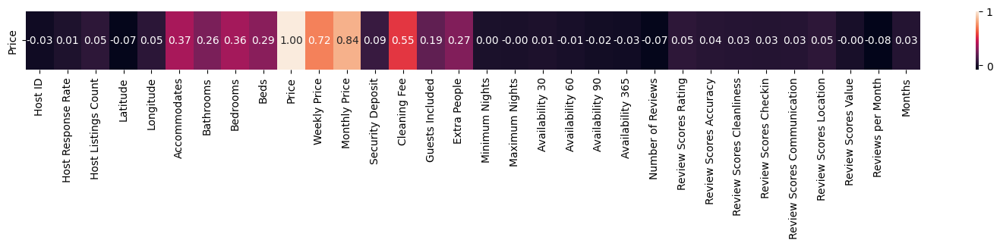

In [ ]:
num = df.select_dtypes(include = ('int64','float64','int32'))
numcorr = num.corr()
f, ax = plt.subplots(figsize = (19,1)) # set figure size
sns.heatmap(numcorr.sort_values(by = 'Price', ascending = False).head(1), annot = True, fmt = ".2f")
plt.show()

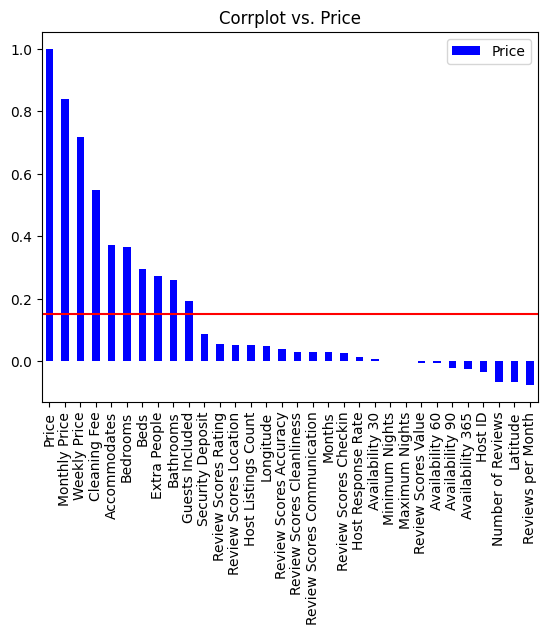

In [ ]:
numcorr['Price'].sort_values(ascending = False).to_frame().plot.bar(color = 'blue')
plt.axhline(y = 0.15, color = 'r', linestyle = '-')
plt.title('Corrplot vs. Price')
plt.show()

In [ ]:
corrmat=df.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(25,25))
g=sns.heatmap(df[top_corr_feature].corr(), annot=True,cmap="vlag")

ValueError: could not convert string to float: 'I am a big out doors fan.'

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
corrmat = df.corr()
top_corr_features = corrmat.index

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
g = sns.heatmap(df[top_corr_features].corr(), annot=True, cmap="vlag")
plt.show()


ValueError: could not convert string to float: 'I am a big out doors fan.'

In [ ]:
plt.figure(figsize=(10,5))

sns.heatmap(df.corr(),
            annot=True,
            linewidths=0.5,vmin=-1,vmax=1,
            center=0,
            cbar=True,
            )

plt.show()

ValueError: could not convert string to float: 'I am a big out doors fan.'

<Figure size 1000x500 with 0 Axes>

In [ ]:
# Select only numeric data and impute missing values as 0
numerics = ['uint8','int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df = df \
    .select_dtypes(include=numerics) \
    .fillna(0) \
    .values

In [ ]:
#correlation matrix
corrmat = df.corr(method = 'spearman')
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

AttributeError: 'numpy.ndarray' object has no attribute 'corr'

In [ ]:
pd.shape

NameError: name 'pd' is not defined